# <div class="alert alert-info"> 1. Overview
    
## <font color=red>1.1. Introduction</font>    
This analysis uses Binance API for retriving information about crypto such as market price, volume, place orders and makes trade. For making decision on trading, it applies RSI to realized patterns of price change 
 
## <font color=red>1.2. Relative Strength Index (RSI)</font>    
    
1.  Relative Strength Index (RSI) is a popular analysis indicator used by many traders. It is a type of momentum oscillator which fluctuates between 0 and 100. Typically, if the RSI goes above 70 this indicates that the stock is overpriced whilst if it goes below 30 the stock is oversold. This helps traders or investors measure the speed and change of a share price

    
2. Mathematically, the RSI can be computed as below. Typically, a window period is considered to compute the RS value
    
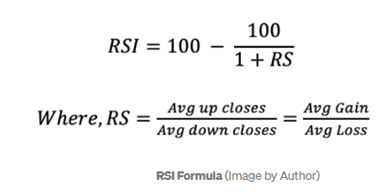
    
    
3. The value of RSI ranges between 0 & 100
    + RSI < 30 indicates an oversold condition -> BUY signal
    + RSI > 70 indicates an overbought condition -> SELL signal

---
---
# <div class="alert alert-info"> 2. Setup

 ## <font color=red>2.1. Import library</font>

**Install binance api**:

    !pip install python-binance  (first: conda upgrade anaconda)
    !pip install pandas_ta

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import time
from datetime import datetime,  timedelta

from binance.client import Client

 ## <font color=red>2.2. Config</font>
 
 **Note**: data retrieved by BinanceAPI and stored in csv for later use 

In [5]:
plt.style.use("seaborn")
pd.options.display.float_format = '{:.4f}'.format

import warnings
warnings.filterwarnings('ignore')
pd.pandas.set_option('display.max_rows', 2000)

# Insert Credentials 
api_key = ""
secret_key = ""

# Creating a connection
client = Client(api_key = api_key, api_secret = secret_key, tld = "com")

---
---
# <div class="alert alert-info"> 3. Get historical data 
    
**Each symbol has its own starting time on Binance**

In [6]:
symbol = 'WAVESUSDT'
timestamp = client._get_earliest_valid_timestamp(symbol = symbol, interval = "1d")
start_time = pd.to_datetime(timestamp, unit = "ms")
start_time

Timestamp('2019-01-18 00:00:00')

In [7]:
def get_history(symbol, interval, start, end = None):
    
    bars = client.get_historical_klines(symbol = symbol, interval = interval, start_str = start, end_str = end)
    
    df = pd.DataFrame(bars)
    df["Date"] = pd.to_datetime(df.iloc[:,0], unit = "ms")
    df.columns = ["Open Time", "Open", "High", "Low", "Close", "Volume",
                  "Clos Time", "Quote Asset Volume", "Number of Trades",
                  "Taker Buy Base Asset Volume", "Taker Buy Quote Asset Volume", "Ignore", "Date"]
    df = df[["Date", "Open", "High", "Low", "Close", "Volume"]].copy()
    df.set_index("Date", inplace = True)
    for column in df.columns:
        df[column] = pd.to_numeric(df[column], errors = "coerce")
    
    return df

#df = get_history(symbol = symbol, interval = "1d", start = str(start_time))
#df.to_csv('wavesusdt.csv')

In [8]:
df = pd.read_csv('wavesusdt.csv',index_col='Date', parse_dates=True)
df = df[['Close']]
df.columns = ['price']
print(df.shape)
df.head()

(1308, 1)


,price
Date,
2019-01-18,2.5235
2019-01-19,2.5718
2019-01-20,2.5071
2019-01-21,2.5001
2019-01-22,2.7684


<AxesSubplot:xlabel='Date', ylabel='price'>

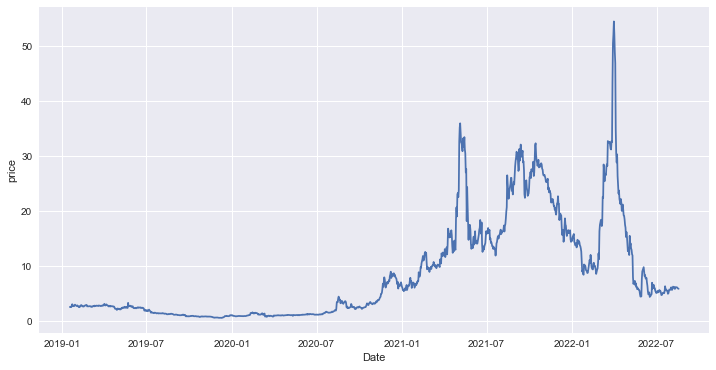

In [9]:
plt.figure(figsize=(12,6))
sns.lineplot(data=df, x="Date", y="price")

---
---
# <div class="alert alert-info">4. Analysis of trading with RSI

## <font color=red>4.1. Get historical data with 15mins interval
    
This analysis chooses time interval of 15 mins to investigate trading opportunities. But firstly, collect a part of data to analyze and understand patterns 

In [10]:
start_time = '2022-05-01'
#end_time = '2022-05-10'

#df = get_history(symbol = symbol, interval = "15m", start = str(start_time), end=str(end_time))
#df = get_history(symbol = symbol, interval = "15m", start = str(start_time))
#df.to_csv('wavesusdt_15mins.csv')

df = pd.read_csv('wavesusdt_15mins.csv',index_col='Date', parse_dates=True)
df = df[['Close']]
df.columns = ['price']
df['Date'] = df.index
data = df.copy()
print(df.shape)

(10392, 2)


## <font color=red>4.2. Apply SMA to smooth time series data

SMA (simple moving average) is a technical indicator that "smooth out" fluctuations by averaging a fixed number of data points to help distinguish between typical market flutuations (noise) and actual movement (trend)

We can try different values of SMA to choose the best time interval for trading. The plot below using 3 SMAs (SMA_1, SMA_2, SMA_3) along the actual price in order to examine and compare which value matches the price movement best to get as much  trading opportunities as possible

In [11]:
def explore_with_sma(data, sma):
    data['sma1'] = data['price'].rolling(sma[0]).mean()
    data['sma2'] = data['price'].rolling(sma[1]).mean()
    data['sma3'] = data['price'].rolling(sma[2]).mean()
    
    return data

def plot_sma(data, symbol, figsize=(25,10)):
    plt.figure(figsize=figsize)
    sns.lineplot(data=data, x='Date', y='price', color='yellow')
    sns.lineplot(data=data, x='Date', y='sma1', color='red')
    sns.lineplot(data=data, x='Date', y='sma2', color='blue')
    sns.lineplot(data=data, x='Date', y='sma3', color='green')
    plt.legend(['Close Price', 'sma1', 'sma2', 'sma3'])
    plt.title(symbol)

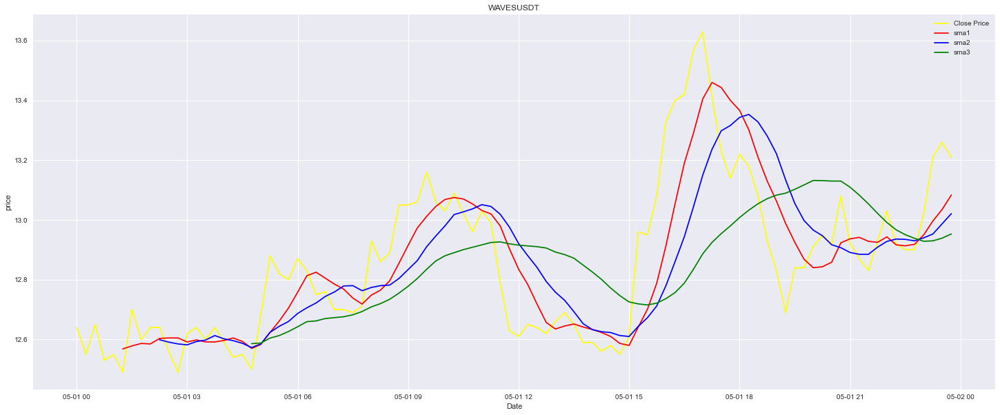

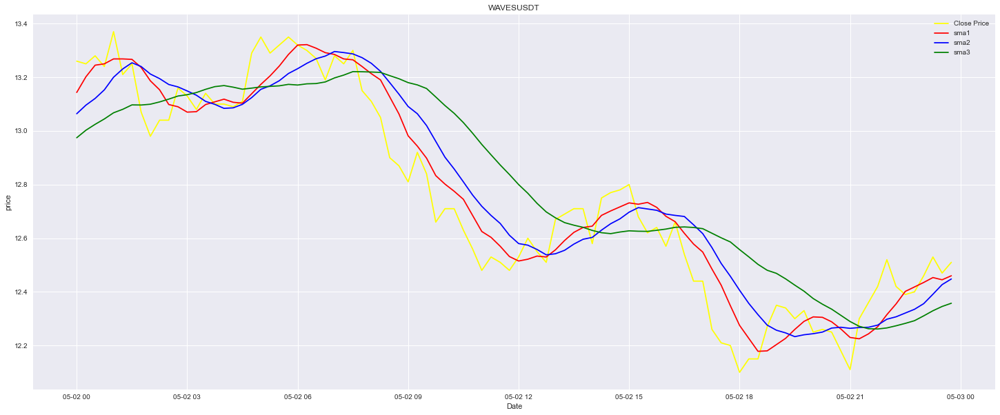

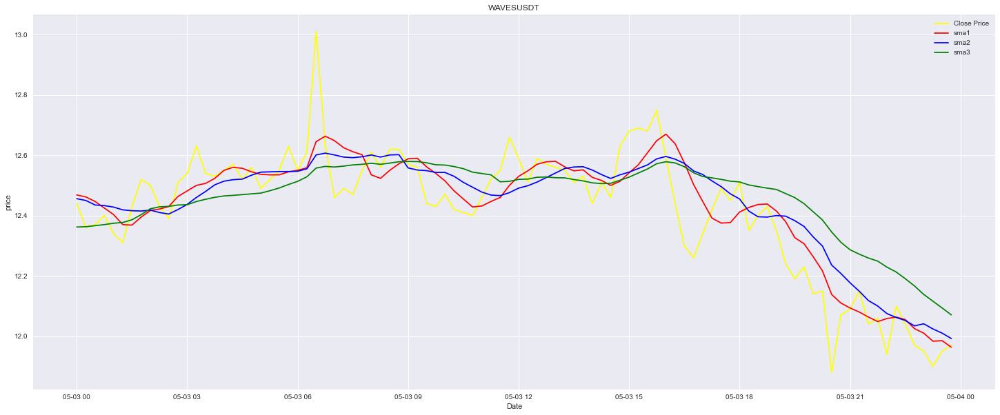

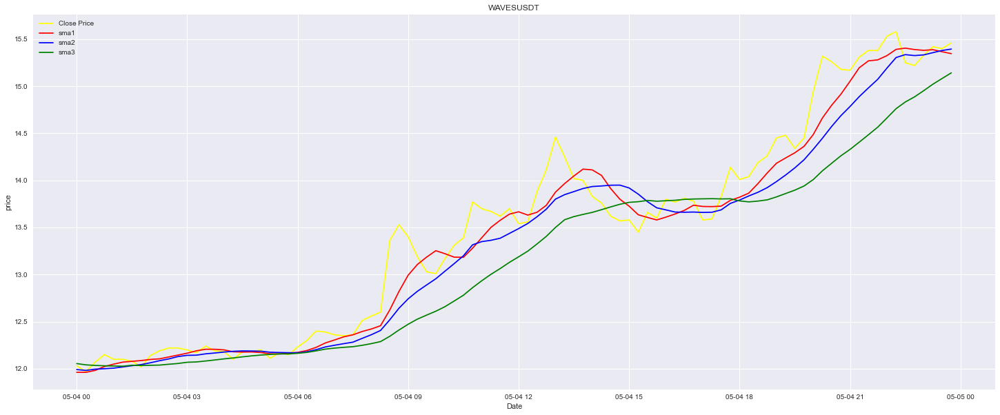

In [12]:
from_date = pd.to_datetime('2022-05-01')
to_date = pd.to_datetime('2022-05-05')
n_days = to_date - from_date

df = explore_with_sma(df, [6, 10, 20])
for i in range(0, n_days.days, 1):
    current_date = from_date + timedelta(days=i)
    current_date  =  str(current_date.date())
    plot_sma(df.loc[current_date], symbol)

=> It can be seen from the plot that the red line (sma=6) recognizes pattern of change better => so sma_6 is chosen for calculating indicators for trading

## <font color=red>4.3. RSI

The following code covers three alternatives, but it is separated and explained further in the next part 5. Back testing with different scenarios

**Alternative 1 - using only rsi and rsi_ratio to track pattern of price  movement**

+ if rsi > upper threshold (E.g., 70%) => signal for selling: It means that price is likely to go down soon, we can start selling
+ if rsi < lower threshold (E.g. 30%) => signal for buying: It means that price is likely to go up soon, we can start buying

=>  However, using only rsi is not good in many cases when price keep going up or down much longer beyond the threshold. In order to alleviate the situation of selling too soon or buying too late, it is necessary to have an indicator to estimate  the most appropriate time that the price changes direction. 2 more indicators below are used: 
+ Calculate rsi_1 to track the trend of price at the previous step
+ Calculate rsi_ratio = rsi/rsi_1. 
+ If (rsi > upper_threshold) & (rsi_ratio < rsi_limit1): signals that price starts changing direction => selling
+ If (rsi < lower_threshold) & (rsi_ratio > rsi_limit2): signals that price starts changing => buying


**Alternative 2 - cut loss in case price going down for a long time (bear market)**
1. Set a cut_loss threshold, and check if the current price < cut_loss threshold => selling


**Alternative 3 - cut loss in bear market and re-enter in bull market**
1. Set a cut_loss threshold, and check if the current price < cut_loss threshold => selling
2. check an additional case: (rsi > upper_threshold) & (rsi_ratio > rsi_limit2) => signals that price keeps goes up => buying

In [13]:
import talib
import pandas_ta as pta

def calculate_rsi(data, rsi_period, sma_period, lower_th, upper_th, rsi_limit1=None,rsi_limit2=None,
                  current_position=0, cutloss_flag=0, cutloss_th=0.3,increase_flag=0):
    
    # define new variables for calculating rsi and track trend pattern
    data['sma'] = data['price'].rolling(sma_period).mean()
    data['rsi'] = pta.rsi(data['sma'], rsi_period)
    data['rsi_indicator'] = np.nan
    data['rsi_signal'] = np.nan
    data['position'] = current_position
    data['strategy'] = np.nan
    data['rsi_1'] = data['rsi'].shift(1)
    data['rsi_ratio'] = data['rsi']/data['rsi_1']   
    buy_price = 0
    
    # rsi_indicator: 0 indicates selling signal, 1 indicates buying signal
    data.loc[(data['rsi'] > upper_th), 'rsi_indicator'] = 0
    data.loc[data['rsi'] < lower_th, 'rsi_indicator'] = 1
    cut_loss = 0
    
    # 
    if(rsi_limit2 == None):
        data.loc[(data['rsi'] > upper_th) , 'rsi_signal'] = 'SELL'
    else:
        data.loc[(data['rsi'] > upper_th) & (data['rsi_ratio'] < rsi_limit2), 'rsi_signal'] = 'SELL'
       
    if(rsi_limit1 == None):
        data.loc[(data['rsi'] < lower_th) , 'rsi_signal'] = 'BUY'
    else:
        data.loc[(data['rsi'] < lower_th) & (data['rsi_ratio'] > rsi_limit1), 'rsi_signal'] = 'BUY'
     
    # Note: rsi_signal is signal to buy or sell, and based on this signal and the position (long or short), 
    # the decision will be made. 
    # For example, if the signal is buy (rsi_signal = BUY), but we're holding a symbol (long position), then we don't buy more => rsi_strategy = NA
    # If signal is sell (rsi_signal=SELL), but we don't hold a symbol (short position), then we can't sell => rsi_strategy = NA
    
    # Case 1: simplest - using only rsi_signal to decide buying or selling
    if((cutloss_flag == 0) & (increase_flag == 0)):
        print('case 1')
        for index, row in data.iterrows():
            # signal to buy
            if(data.loc[index,'rsi_signal'] == "BUY"):
                if(current_position == 0):
                    current_position = 1
                    data.loc[index, 'strategy'] = 'BUY'
            # signal to sell
            elif(data.loc[index,'rsi_signal'] == 'SELL'):
                if(current_position == 1):
                    current_position = 0
                    data.loc[index, 'strategy'] = 'SELL'   
            data.loc[index,'position'] = current_position   

            
    # Case 2: in case hold a coin and the market keeps going down => need to recognize and cut loss soon
    if((cutloss_flag == 1) & (increase_flag == 0)):
        print('case 2')
        for index, row in data.iterrows():
            # in normal situation
            if(cut_loss == 0):
                current_price = data.loc[index, 'price']
                # signal to buy
                if(data.loc[index,'rsi_signal'] == "BUY"):
                    if(current_position == 0):
                        current_position = 1
                        data.loc[index, 'strategy'] = 'BUY'
                        # save buy price
                        buy_price = data.loc[index, 'price']
                # signal to sell
                elif(data.loc[index,'rsi_signal'] == 'SELL'):
                    if(current_position == 1):
                        current_position = 0
                        data.loc[index, 'strategy'] = 'SELL'
                # in long position and price keeps going down => cut loss
                if(current_position == 1):
                    #if(current_price < buy_price - cutloss_th):
                    difference = current_price - buy_price
                    if( difference <= - ((cutloss_th * buy_price) /100)):
                        current_position = 0
                        data.loc[index, 'strategy'] = 'SELL'   
                        cut_loss = 1
            # in case of cut loss position, need to wait until rsi singals has a clear increasing trend to buy
            elif(cut_loss == 1):
                if(data.loc[index,'rsi'] > 30):
                    current_position = 1
                    data.loc[index, 'strategy'] = 'BUY'
                    buy_price = data.loc[index, 'price']    
                    cut_loss = 0
            data.loc[index,'position'] = current_position
    
    # Case 3: solving for both bear and bull market
    if((cutloss_flag == 1) & (increase_flag == 1)):
        # print('case 3')
        for index, row in data.iterrows():
            if(cut_loss == 0):
                current_price = data.loc[index, 'price']
                if(data.loc[index,'rsi_signal'] == "BUY"):
                    if(current_position == 0):
                        current_position = 1
                        data.loc[index, 'strategy'] = 'BUY'
                        buy_price = data.loc[index, 'price']
                elif(data.loc[index,'rsi_signal'] == 'SELL'):
                    if(current_position == 1):
                        current_position = 0
                        data.loc[index, 'strategy'] = 'SELL'
                # cut loss
                if(current_position == 1):
                    #if(current_price < buy_price - cutloss_th):
                    difference = current_price - buy_price
                    if( difference <= - ((cutloss_th * buy_price) /100)):
                        current_position = 0
                        data.loc[index, 'strategy'] = 'SELL'   
                        cut_loss = 1
                # increase trend
                if(current_position == 0):
                    if((data.loc[index,'rsi'] > upper_th) & ((data.loc[index,'rsi_ratio'] > rsi_limit1))):
                        current_position = 1
                        data.loc[index, 'strategy'] = 'BUY'
                        buy_price = data.loc[index, 'price']                        
            elif(cut_loss == 1):
                if((data.loc[index,'rsi'] > 30) & (data.loc[index,'rsi_ratio'] > rsi_limit1)):
                    current_position = 1
                    data.loc[index, 'strategy'] = 'BUY'
                    buy_price = data.loc[index, 'price']    
                    cut_loss = 0
            data.loc[index,'position'] = current_position
    
    return data


In [14]:
def plot_RSI_signal(data, symbol,flag=0):

    #plot close price 
    plt.figure(figsize=(26,12))
    graph = sns.lineplot(data = data, x = 'Date', y = 'price', color='yellow')
    sns.lineplot(data = data, x = 'Date', y = 'sma', color='red')
    graph.set_title(symbol)  
    
    # RSI rsi_indicator
    rsi_indicator = data.loc[data['rsi_indicator'].isin([0,1])]
    rsi_indicator = rsi_indicator.reset_index(drop = True)
    
    # RSI signals
    rsi_signals = data.loc[data['rsi_signal'].isin(['BUY','SELL'])]
    rsi_signals = rsi_signals.reset_index(drop = True)
    
    # RSI strategy
    strategy = data.loc[data['strategy'].isin(['BUY','SELL'])]
    strategy = strategy.reset_index(drop = True)
    
    #Add rsi indicators on price 
    for x,y,z in zip(rsi_indicator['Date'], rsi_indicator['sma'], np.round(rsi_indicator['rsi'],2)):
        label = z #Label corresponds to labels in dataset
        plt.annotate(label, #text to be displayed
                    (x,y), #point for the specific label
                    textcoords="offset points", #positioning of the text
                    xytext=(0,8), #distance from text to points
                    ha='center',
                    fontsize = 11) #horizontal alignment
    
    # Add rsi_ratio on price 
    for x,y,z in zip(rsi_indicator['Date'], rsi_indicator['sma'], np.round(rsi_indicator['rsi_ratio'],2)):
        label = z #Label corresponds to labels in dataset
        plt.annotate(label, #text to be displayed
                        (x,y), #point for the specific label
                        textcoords="offset points", #positioning of the text
                        xytext=(0,-18), #distance from text to points
                        ha='center',
                        fontsize = 11,
                        color='green') #horizontal alignment
    

    if(flag == 0):
        #Add rsi_singal 
        for x,y,z in zip(rsi_signals['Date'], rsi_signals['sma'], rsi_signals['rsi_signal']):
            label = z #Label corresponds to labels in dataset
            plt.annotate(label, #text to be displayed
                        (x,y), #point for the specific label
                        textcoords="offset points", #positioning of the text
                        xytext=(0,15), #distance from text to points
                        ha='center',
                        fontsize = 15,
                        color='red') #horizontal alignment
    else:
        #Add rsi_strategy 
        for x,y,z in zip(strategy['Date'], strategy['sma'], strategy['strategy']):
            label = z #Label corresponds to labels in dataset
            plt.annotate(label, #text to be displayed
                        (x,y), #point for the specific label
                        textcoords="offset points", #positioning of the text
                        xytext=(0,18), #distance from text to points
                        ha='center',
                        fontsize = 15,
                        color='red') #horizontal alignment
    plt.legend(['Close Price', 'sma'])

            
def plot_daily_trading(data, from_date, to_date, title, flag):
    from_date = pd.to_datetime(from_date)
    to_date = pd.to_datetime(to_date)
    n_days = to_date - from_date
    current_date = from_date 

    for i in range(0, n_days.days, 1):
        current_date = from_date + timedelta(days= i)
        current_date = str(current_date.date())
        plot_RSI_signal(data.loc[current_date], title,flag)
        
        
def calculate_performance(data):
    
    # performance in case buy and hold
    data["returns"] = np.log(data.price.div(data.price.shift(1)))
    data["creturns"] = data["returns"].cumsum().apply(np.exp)
    perf = data["creturns"].iloc[-1]
    
    data["rsi_returns"] =np.log(data.price.div(data.price.shift(1)))
    # case 1: udpate rsi returns on records not holding asset
    data.loc[(data['position'] == 0) & (~data['strategy'].isin(['BUY','SELL'])), 'rsi_returns'] = 0
    # case 2: update rsi returns on records not buying to 0
    data.loc[(data['position'] == 1) & (data['strategy']=='BUY'), 'rsi_returns'] = 0
    data["rsi_creturns"] = data["rsi_returns"].cumsum().apply(np.exp)     
    rsi_perf = data["rsi_creturns"].iloc[-1]
    ourperf = rsi_perf - perf
    print(perf, rsi_perf, ourperf)
    return data

    #data[["creturns", "rsi_creturns"]].plot(figsize = (15, 8), fontsize = 12)
    #plt.legend(fontsize = 12)
    #plt.show()

---
---
# <div class="alert alert-info">5. Back testing with different scenarios

## <font color=red>5.1. price flunctuates around mean for a period of time

In [37]:
start_time = '2022-02-01'
end_time = '2022-02-25'
rsi_period = 6
sma_period = 6

'''
# this script is for getting data from Binance API
df = get_history(symbol = symbol, interval = "15m", start = str(start_time), end=str(end_time))
df = df[['Close']]
df.columns = ['price']
df['Date'] = df.index
df.to_csv('fluctating_price.csv', index=False)
'''

# read data from csv file
df = pd.read_csv('fluctating_price.csv')
df['Date'] = pd.to_datetime(df['Date'])
df.index = df['Date']
print(df.shape)

(2305, 2)


In [16]:
df.head()

,price,Date
Date,,
2022-02-01 00:00:00,9.0700,2022-02-01 00:00:00
2022-02-01 00:15:00,9.0600,2022-02-01 00:15:00
2022-02-01 00:30:00,9.0500,2022-02-01 00:30:00
2022-02-01 00:45:00,9.0300,2022-02-01 00:45:00
2022-02-01 01:00:00,9.0400,2022-02-01 01:00:00


<AxesSubplot:xlabel='Date', ylabel='price'>

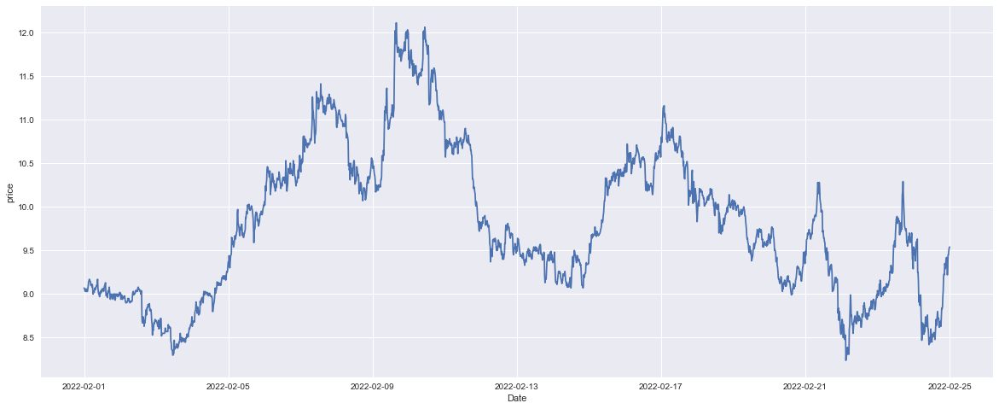

In [17]:
plt.figure(figsize=(20,8))
sns.lineplot(data=df, x='Date', y='price')

### <font color=blue> Case 1 - Alternative 1: using only rsi as a signal for trading (buy or sell) 

The following code performs the following tasks:
1. Firstly, it calculates rsi to track the pattern of price movement, this rsi value is also used to compare with a lower or upper threshold (rsi_signal) as an indicator to buy or sell. 
    
2. However, actual BUYING or SELLING is also depended on the current position we're holding:  
    + If signal is BUY (rsi_signal = BUY), and we're not holding the asset then it buys 1 (rsi_strategy=BUY), but we're holding the asset (long position), then we don't buy more => rsi_strategy = NA
    + In opposite, if signal is sell (rsi_signal=SELL) and we're holding the asset then it sells the asset (short position), then we can't sell => rsi_strategy=SELL, but if we're not holding the asset then of course it can't sell it and rsi_strategy=NA   
    
3.  In summary, rsi_signal variable is the indicator for making trading, it has 3 values: na means doing nothing, 'SELL' indicates appropriate time for selling asset, 'BUY' indicates appropricate time for buying asset. However, actual SELL or BUY made is stored in rsi_strategy


In [18]:
def calculate_rsi1(data, rsi_period, sma_period, lower_th, upper_th, rsi_limit1=None,rsi_limit2=None,current_position=0):
    
    # define new variables for calculating rsi and track trend pattern
    data['sma'] = data['price'].rolling(sma_period).mean()
    data['rsi'] = talib.RSI(data['sma'], rsi_period)
    data['rsi_indicator'] = np.nan
    data['rsi_signal'] = np.nan
    data['position'] = current_position
    data['strategy'] = np.nan
    data['rsi_1'] = data['rsi'].shift(1)
    data['rsi_ratio'] = data['rsi']/data['rsi_1']   
    
    # rsi_indicator: 0 indicates selling signal, 1 indicates buying signal
    data.loc[(data['rsi'] > upper_th), 'rsi_indicator'] = 0
    data.loc[data['rsi'] < lower_th, 'rsi_indicator'] = 1
    
    # using only rsi indicator
    if(rsi_limit2 == None):
        data.loc[(data['rsi'] > upper_th) , 'rsi_signal'] = 'SELL'
    # 
    else:
        data.loc[(data['rsi'] > upper_th) & (data['rsi_ratio'] < rsi_limit2), 'rsi_signal'] = 'SELL'
       
    if(rsi_limit1 == None):
        data.loc[(data['rsi'] < lower_th) , 'rsi_signal'] = 'BUY'
    else:
        data.loc[(data['rsi'] < lower_th) & (data['rsi_ratio'] > rsi_limit1), 'rsi_signal'] = 'BUY'
      
    # Alternative 1: simplest - using only rsi_signal to decide buying or selling
    for index, row in data.iterrows():
        # signal to buy
        if(data.loc[index,'rsi_signal'] == "BUY"):
            # actual decision
            if(current_position == 0):
                current_position = 1
                data.loc[index, 'strategy'] = 'BUY'
        # signal to sell
        elif(data.loc[index,'rsi_signal'] == 'SELL'):
            # actual decision
            if(current_position == 1):
                current_position = 0
                data.loc[index, 'strategy'] = 'SELL'   
        # update current position
        data.loc[index,'position'] = current_position   
            
    return data

1.0518191841234847 0.8378710270160215 -0.2139481571074633


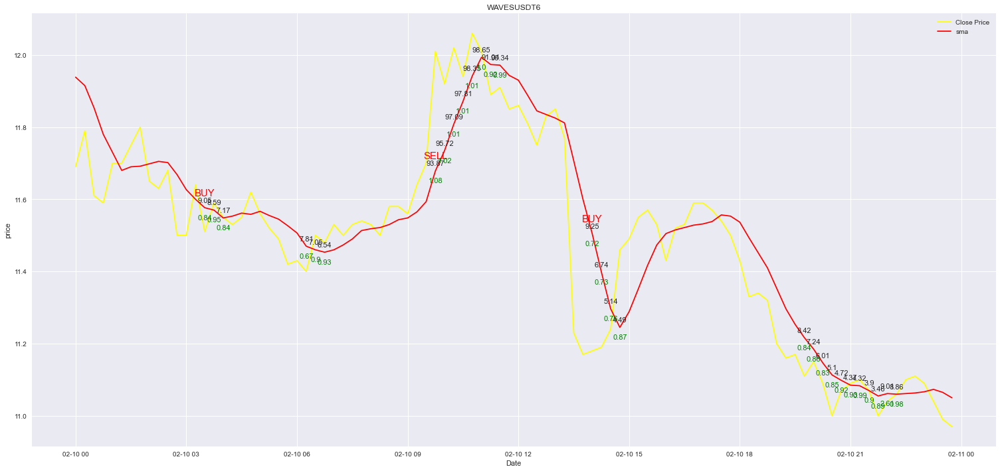

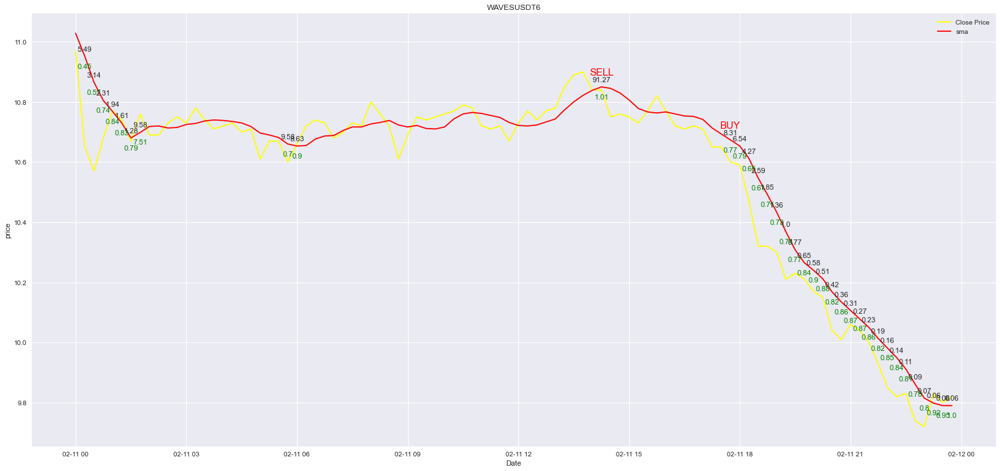

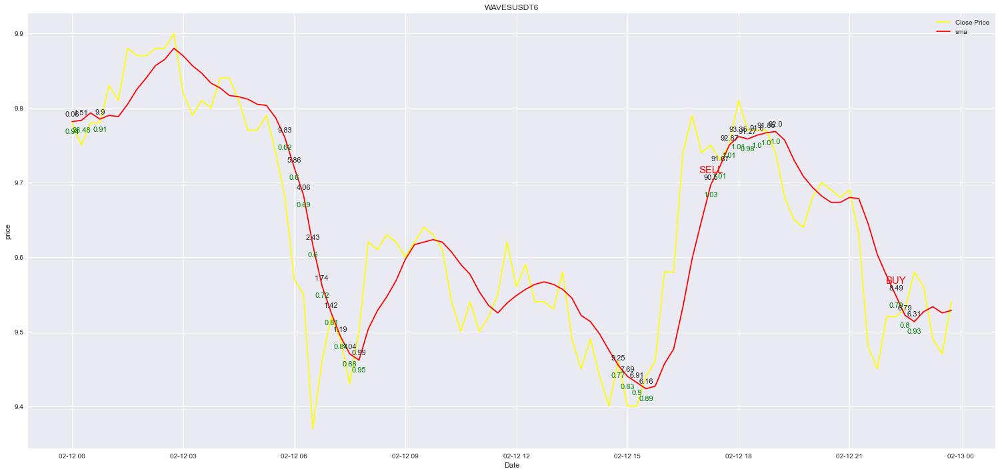

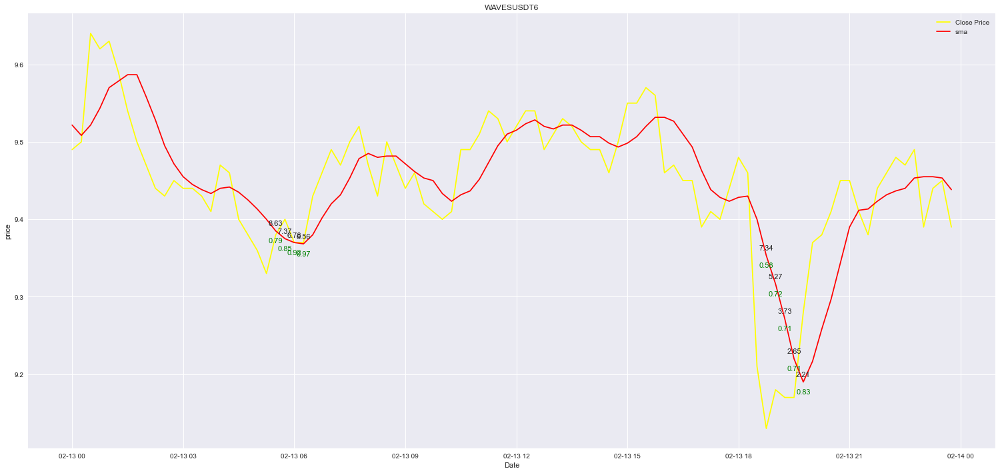

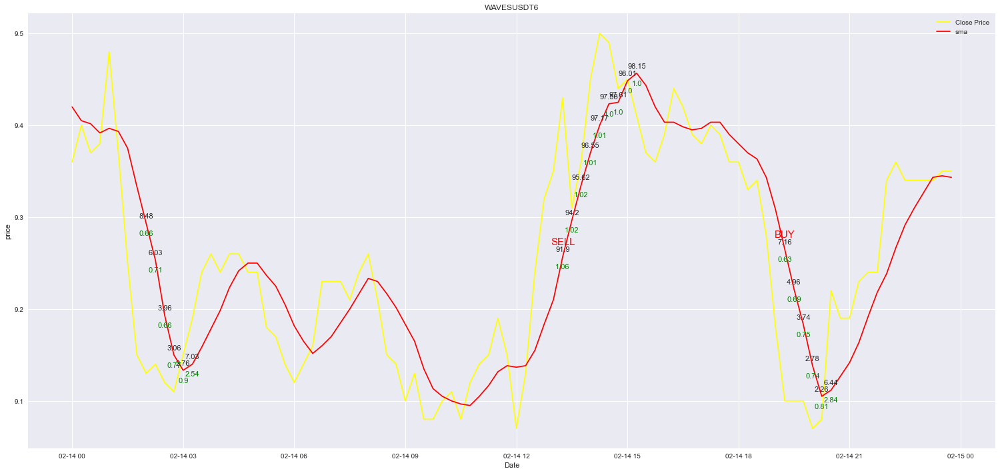

...

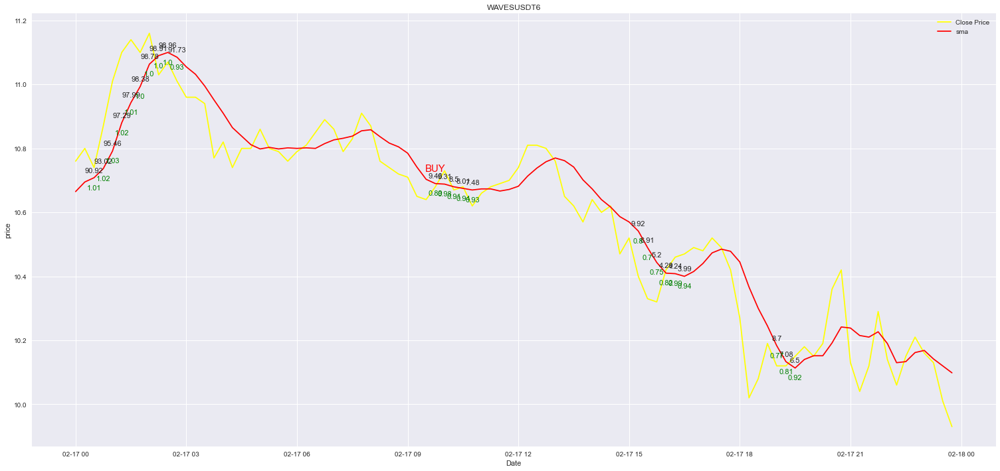

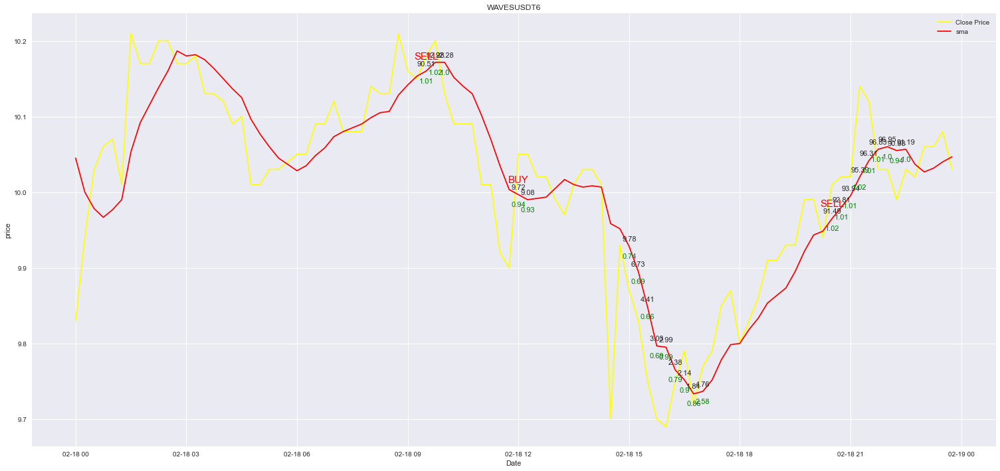

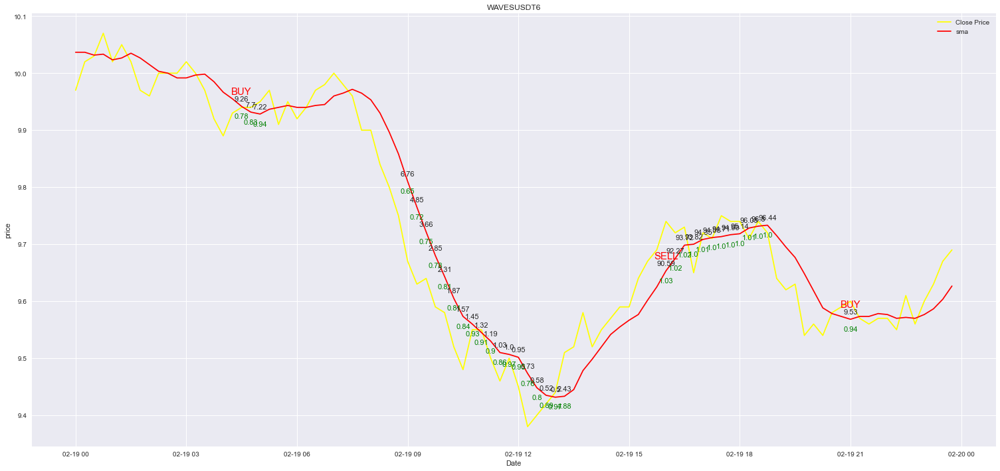

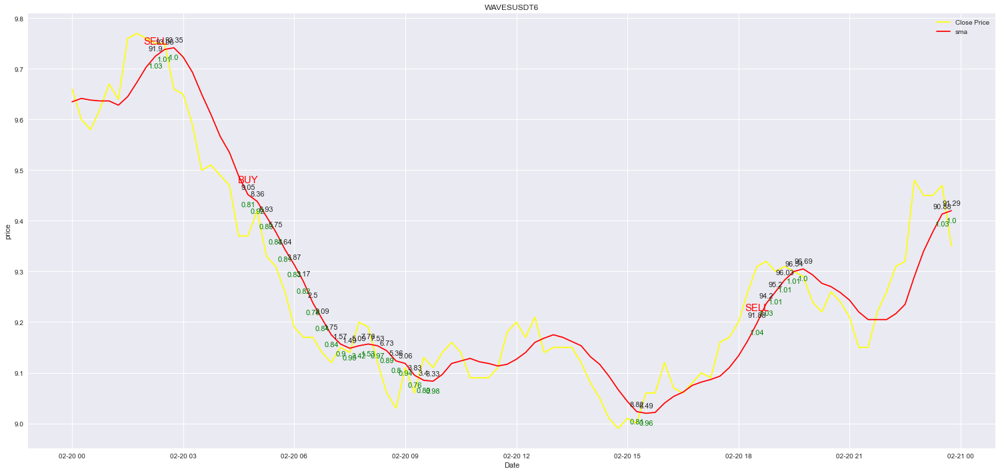

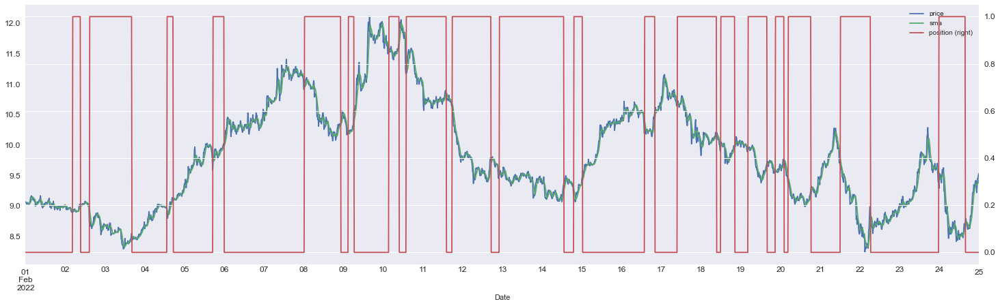

In [19]:
current_position=0
lower_threshold = 10; upper_threshold = 90
rsi_limit1 = None; rsi_limit2  = None
cutloss_flag = 0
from_date = '2022-02-10'
to_date = '2022-02-21'

df = calculate_rsi1(df, rsi_period, sma_period, lower_threshold, upper_threshold, rsi_limit1=rsi_limit1, rsi_limit2=rsi_limit2)
plot_daily_trading(df,from_date,to_date, symbol + str(sma_period), 1)
df.loc[start_time:end_time][["price","sma","position"]].plot(figsize = (25, 7), fontsize = 12, secondary_y = "position",)
df = calculate_performance(df)

=> The performance of rsi strategy is a bit lower than long hold strategy. This is because there are problems with this approach such as:

+ **Buying too soon**: although rsi < 10, price keeps going down on days: 02-10, 02-11, 02-14, 02-16, 02-18, 02-19, 02-20. 
+ **Selling too soon**: similarly, although rsi > 90 but selling is still too soon while price going to increase on 02-10, 02-14, 02-15, 02-16, 02-19, 02-20

=> Hence, using only rsi is not enough to making a good decision

In [21]:
df.price.iloc[-1] - df.price.iloc[0]

0.46999999999999886

In [22]:
sum(df.returns.dropna()), np.exp(sum(df.returns.dropna())), df.price.iloc[0] *  np.exp(sum(df.returns.dropna()))

(0.050521221333150616, 1.0518191841234847, 9.540000000000006)

### <font color=blue> Case 2- Alternative 1: using both rsi and rsi_ratio as a signal for trading (buy or sell) 

We can calcualte rsi_ratio, which is rsi / rsi of previous day. if the current price keeps increasing then rsi_ratio > 1, if the current price is decreasing then rsi_ratio < 1. 

Hence, rsi can be combined with rsi_ratio to find the most appropriate time to execute an order. In case the current rsi > 90, but if price keeps going up (rsi_ratio > 1) then it should wait until rsi_ratio < 1 because this means price start going down. It is the same in case price going down after rsi < 10 and it should wait until rsi_ratio > 1

1.0518191841234847 1.1883798341906329 0.13656065006714813


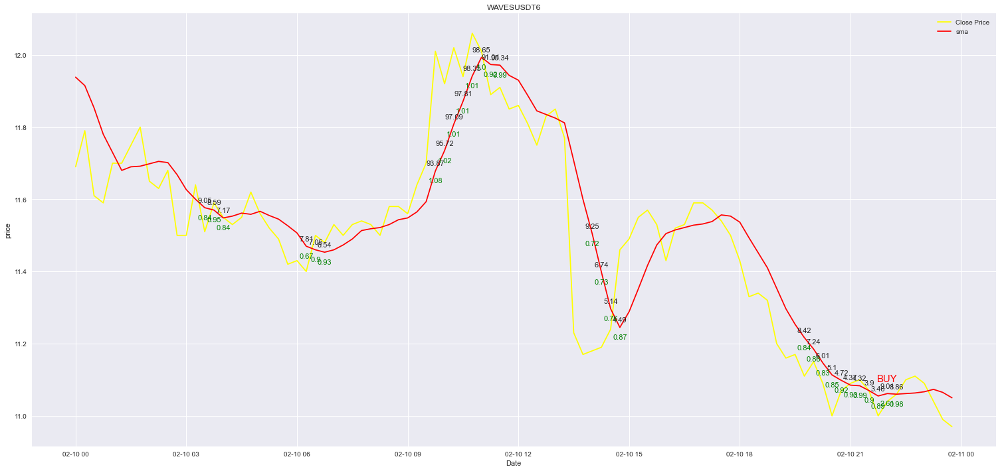

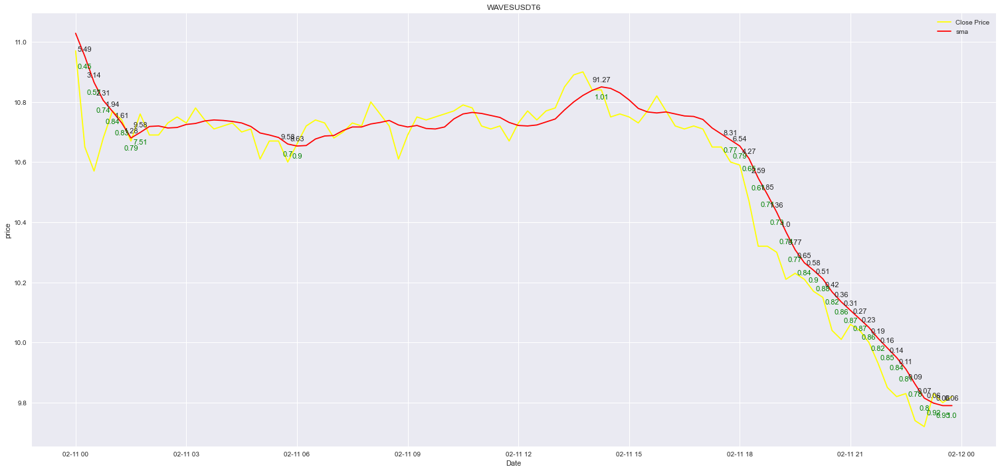

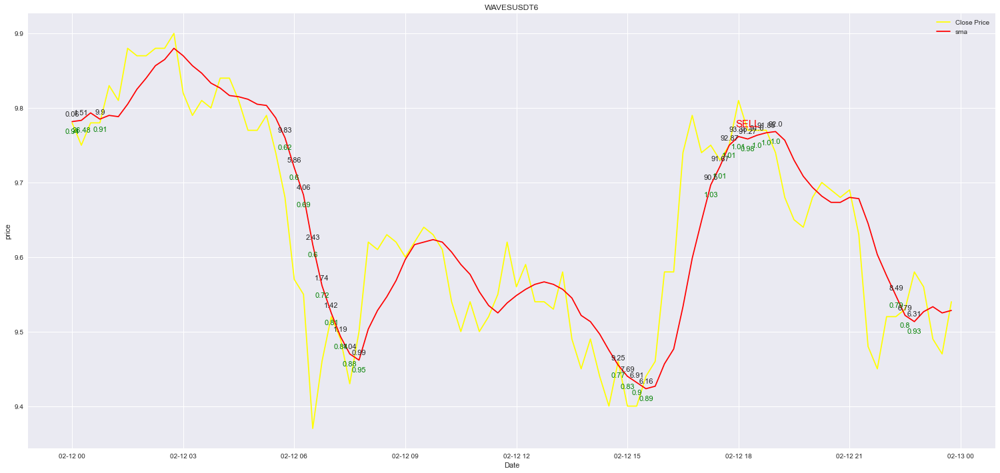

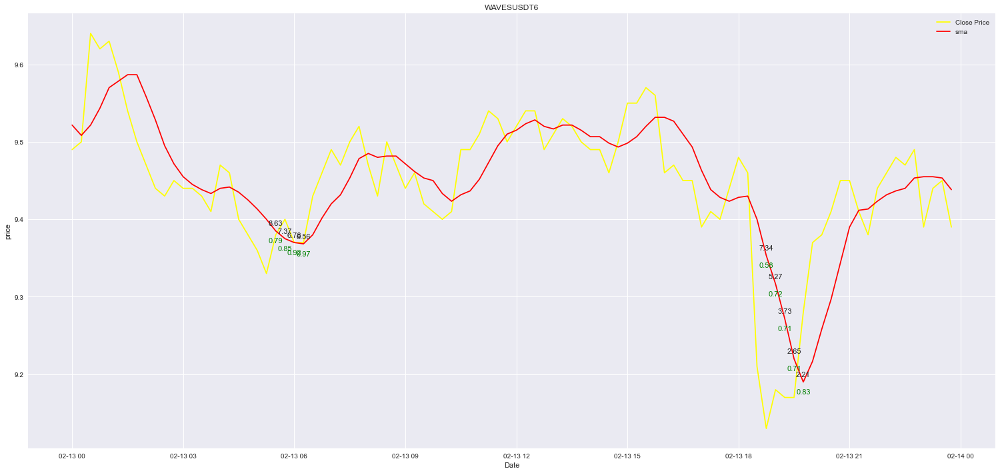

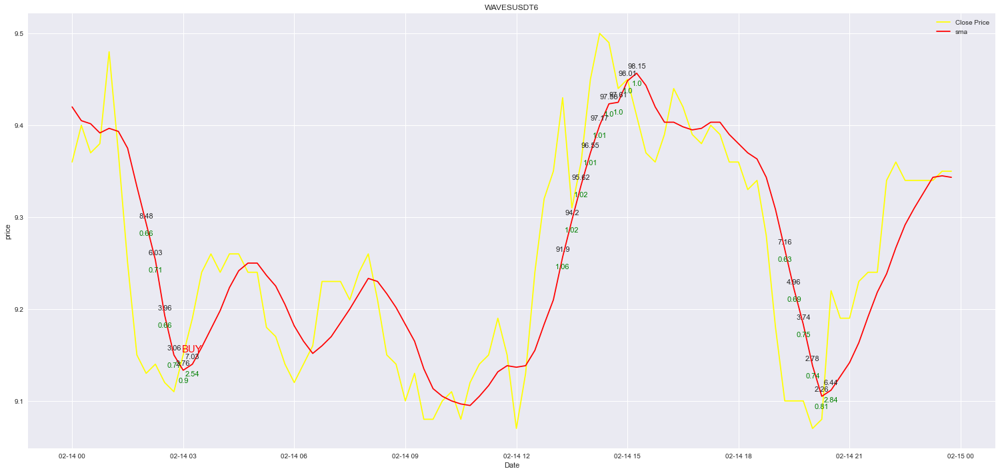

...

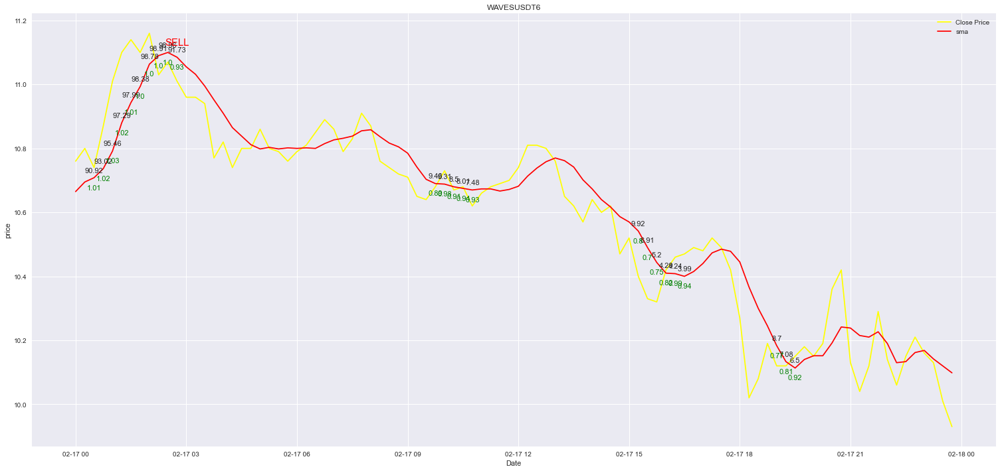

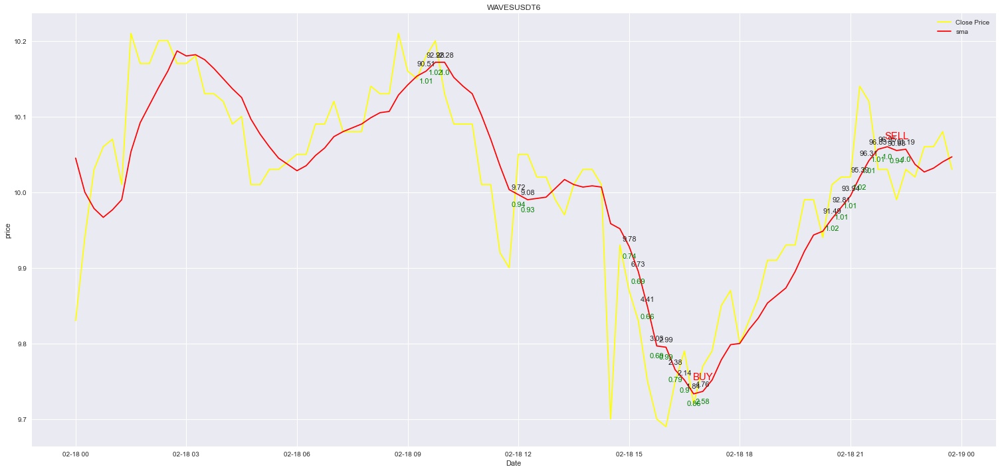

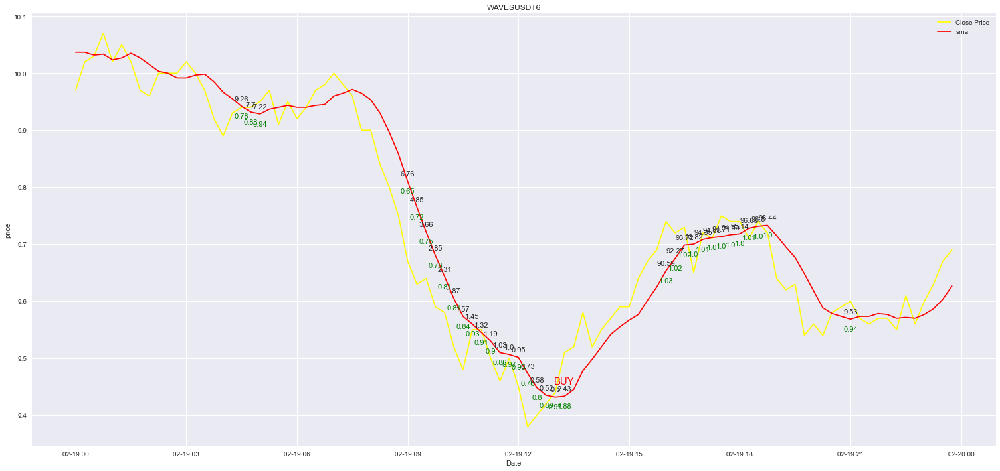

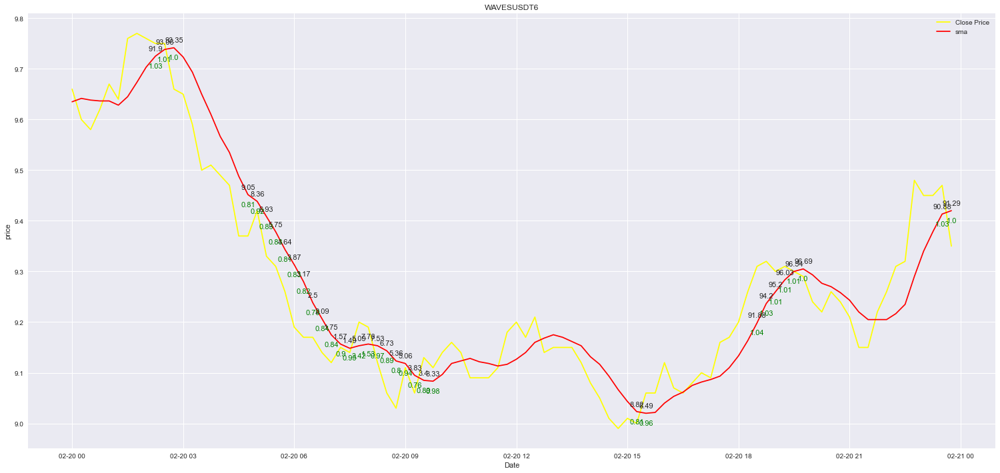

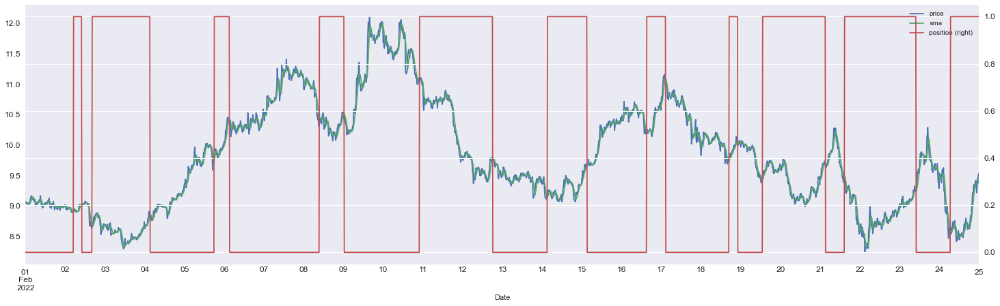

In [23]:
rsi_limit1 = 1; rsi_limit2  = 1
df = calculate_rsi1(df, rsi_period, sma_period, lower_threshold, upper_threshold, rsi_limit1=rsi_limit1, rsi_limit2=rsi_limit2)

plot_daily_trading(df,from_date,to_date, symbol + str(sma_period), 1)
df.loc[start_time:end_time][["price","sma","position"]].plot(figsize = (25, 7), fontsize = 12, secondary_y = "position",)
df = calculate_performance(df)

1. cut loss on 02-11, 02-20
2. increasing trend on 02-15, 

=> The performance of rsi strategy is higher than long hold strategy. This is because it chose the more appropriate time to trade, we can compare actual buying and selling between case1 and case2 on the following days:

+ **Buying too soon**: 02-10, 02-11, 02-14, 02-16, 02-18, 02-19
+ **Selling too soon**: 02-12, 02-17

However, we still have problems in case the bear market when price keeps going down for a long period (such as on 02-11, 02-20) or when price keeps going up for a long period (such as on 02-15). We want the application can recognize and change the position by cut loss soon in bear market and re-enter in the bull market

The following code handles cut loss in case  price keep going down

### <font color=blue> Case 3 - Alternative 2: using cut loss in case the market keeps going down
    
In order to cut loss soon, first we calculate the difference between the current price and buy price. If this difference < a cutloss threshold (cutloss_th) which is -1%, or -5%, or -10% of buy price, then we sell the asset and re-enter when the market goes up again  

In [25]:
def calculate_rsi2(data, rsi_period, sma_period, lower_th, upper_th, rsi_limit1=None,rsi_limit2=None,
                  current_position=0, cutloss_flag=0, cutloss_th=0.05):
    
    # define new variables for calculating rsi and track trend pattern
    data['sma'] = data['price'].rolling(sma_period).mean()
    data['rsi'] = pta.rsi(data['sma'], rsi_period)
    data['rsi_indicator'] = np.nan
    data['rsi_signal'] = np.nan
    data['position'] = current_position
    data['strategy'] = np.nan
    data['rsi_1'] = data['rsi'].shift(1)
    data['rsi_ratio'] = data['rsi']/data['rsi_1']   
    
    # rsi_indicator: 0 indicates selling signal, 1 indicates buying signal
    data.loc[(data['rsi'] > upper_th), 'rsi_indicator'] = 0
    data.loc[data['rsi'] < lower_th, 'rsi_indicator'] = 1
    cut_loss = 0
    
    # 
    if(rsi_limit2 == None):
        data.loc[(data['rsi'] > upper_th) , 'rsi_signal'] = 'SELL'
    else:
        data.loc[(data['rsi'] > upper_th) & (data['rsi_ratio'] < rsi_limit2), 'rsi_signal'] = 'SELL'
       
    if(rsi_limit1 == None):
        data.loc[(data['rsi'] < lower_th) , 'rsi_signal'] = 'BUY'
    else:
        data.loc[(data['rsi'] < lower_th) & (data['rsi_ratio'] > rsi_limit1), 'rsi_signal'] = 'BUY'
              
    # Case 2: in case hold a coin and the market keeps going down => need to recognize and cut loss soon
    if((cutloss_flag == 1)):
        for index, row in data.iterrows():
            # in normal situation
            if(cut_loss == 0):
                current_price = data.loc[index, 'price']
                # signal to buy
                if(data.loc[index,'rsi_signal'] == "BUY"):
                    if(current_position == 0):
                        current_position = 1
                        data.loc[index, 'strategy'] = 'BUY'
                        # save buy price
                        buy_price = data.loc[index, 'price']
                # signal to sell
                elif(data.loc[index,'rsi_signal'] == 'SELL'):
                    if(current_position == 1):
                        current_position = 0
                        data.loc[index, 'strategy'] = 'SELL'
                # in long position and price keeps going down => cut loss
                if(current_position == 1):
                    #if(current_price < buy_price - cutloss_th):
                    difference = current_price - buy_price
                    if( difference <= - ((cutloss_th * buy_price) /100)):
                        current_position = 0
                        data.loc[index, 'strategy'] = 'SELL'   
                        cut_loss = 1
            # in case of cut loss position, need to wait until rsi singals has a clear increasing trend to buy
            elif(cut_loss == 1):
                if(data.loc[index,'rsi'] > 30):
                    current_position = 1
                    data.loc[index, 'strategy'] = 'BUY'
                    buy_price = data.loc[index, 'price']    
                    cut_loss = 0
            data.loc[index,'position'] = current_position
            
    return data
    

1.0518191841234847 1.2499237655975768 0.19810458147409205


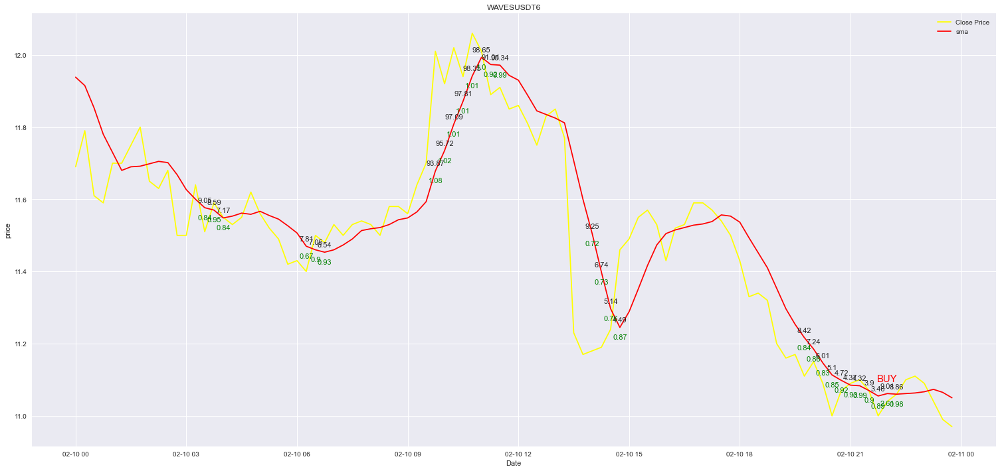

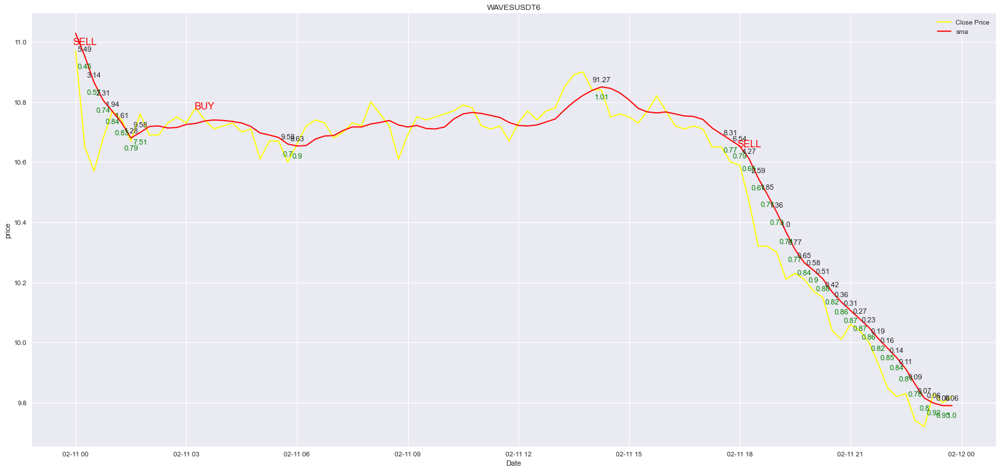

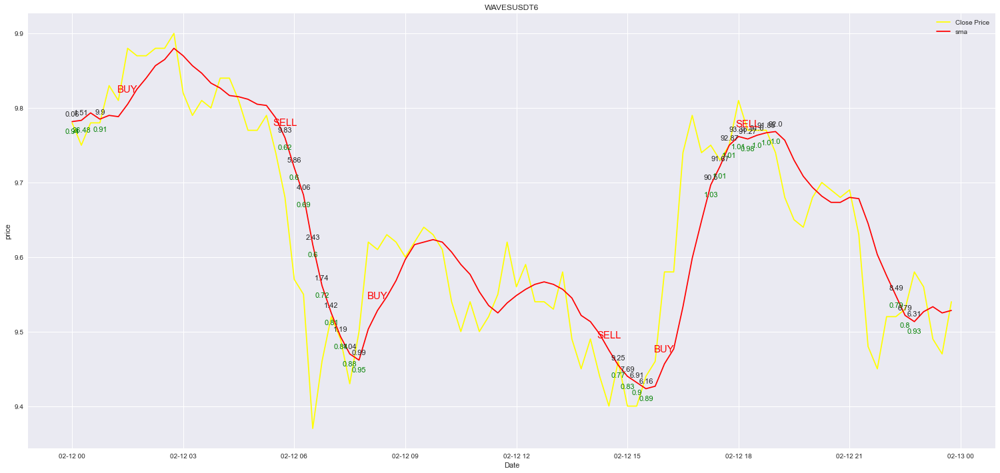

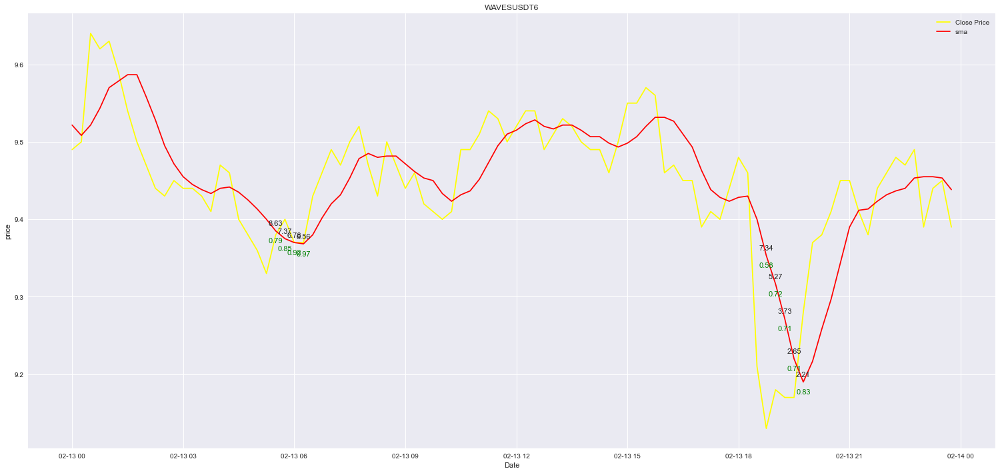

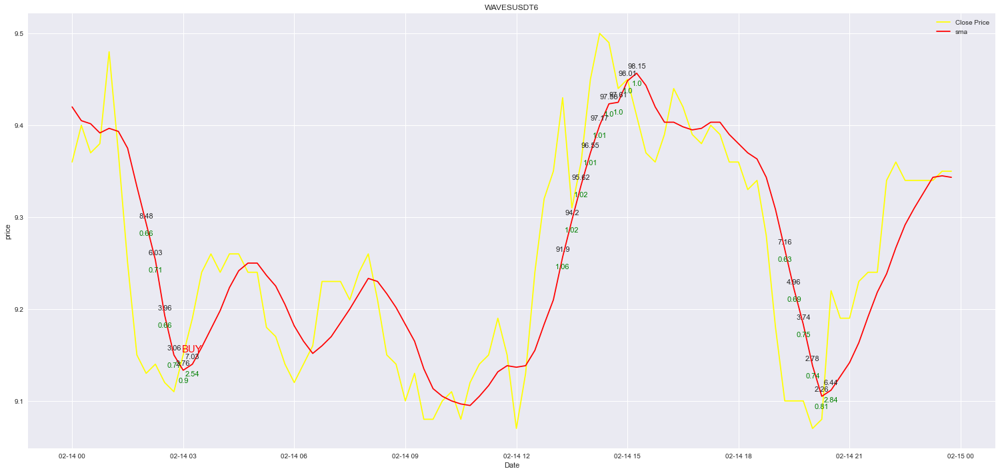

...

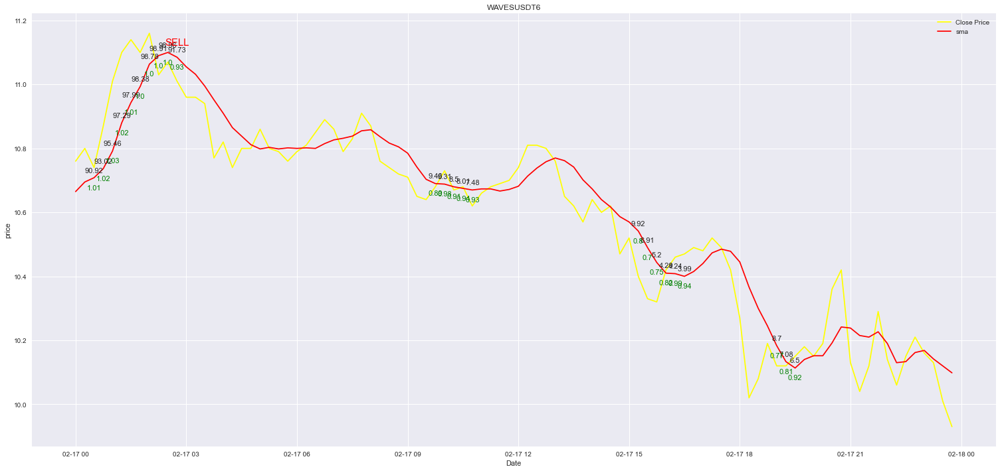

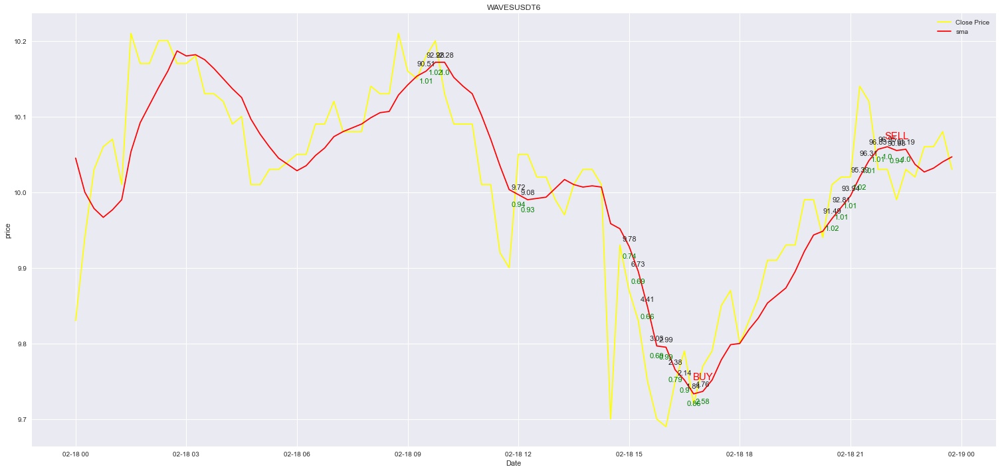

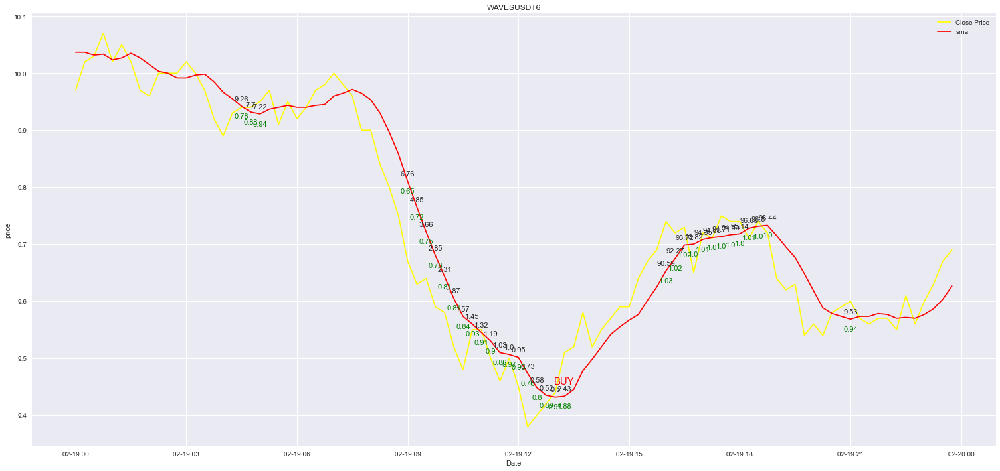

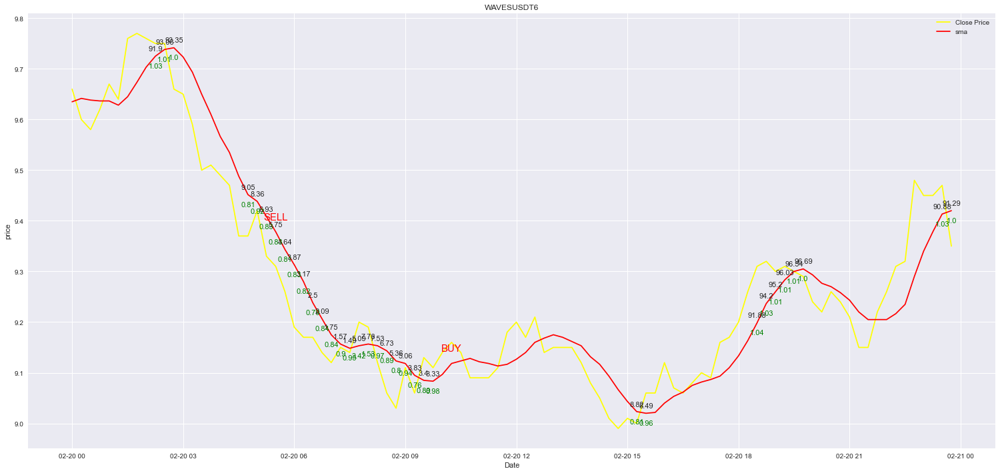

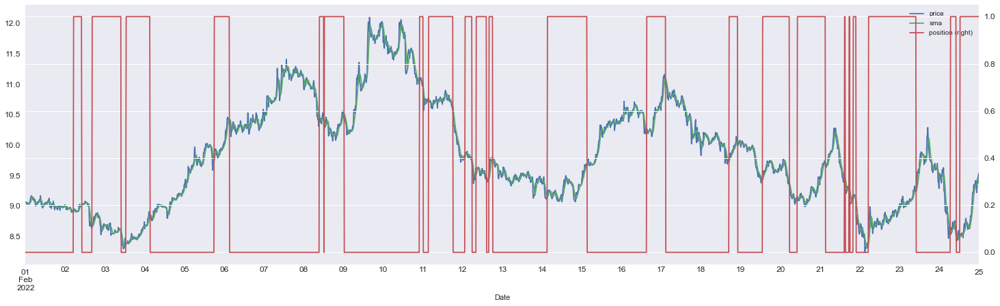

In [26]:
rsi_limit1 = 1; rsi_limit2  = 1; cutloss_flag=1; cutloss_th=2

df = calculate_rsi2(df, rsi_period, sma_period, lower_threshold, upper_threshold, rsi_limit1=rsi_limit1, rsi_limit2=rsi_limit2,
                  cutloss_flag=cutloss_flag, cutloss_th=cutloss_th)
plot_daily_trading(df,from_date,to_date, symbol + str(sma_period), 1)
df.loc[start_time:end_time][["price","sma","position"]].plot(figsize = (25, 7), fontsize = 12, secondary_y = "position",)
df = calculate_performance(df)

It can be seen that it cut loss successfully on days: 02-10, 02-11, 02-12, 02-16, 02-18, 02-19

However, we still have problems in case price keeps going up for a long period (such as on 02-15). We want the application can recognize and re-enter in the bull market

### <font color=blue> Case 4 - Alternative 3: Combine both cut loss and increasing trend

In [28]:
import talib
import pandas_ta as pta

def calculate_rsi3(data, rsi_period, sma_period, lower_th, upper_th, rsi_limit1=None,rsi_limit2=None,
                  current_position=0, cutloss_flag=0, cutloss_th=2,increase_flag=0):
    
    # define new variables for calculating rsi and track trend pattern
    data['sma'] = data['price'].rolling(sma_period).mean()
    data['rsi'] = pta.rsi(data['sma'], rsi_period)
    data['rsi_indicator'] = np.nan
    data['rsi_signal'] = np.nan
    data['position'] = current_position
    data['strategy'] = np.nan
    data['rsi_1'] = data['rsi'].shift(1)
    data['rsi_ratio'] = data['rsi']/data['rsi_1']   
    
    # rsi_indicator: 0 indicates selling signal, 1 indicates buying signal
    data.loc[(data['rsi'] > upper_th), 'rsi_indicator'] = 0
    data.loc[data['rsi'] < lower_th, 'rsi_indicator'] = 1
    cut_loss = 0
    
    # 
    if(rsi_limit2 == None):
        data.loc[(data['rsi'] > upper_th) , 'rsi_signal'] = 'SELL'
    else:
        data.loc[(data['rsi'] > upper_th) & (data['rsi_ratio'] < rsi_limit2), 'rsi_signal'] = 'SELL'
       
    if(rsi_limit1 == None):
        data.loc[(data['rsi'] < lower_th) , 'rsi_signal'] = 'BUY'
    else:
        data.loc[(data['rsi'] < lower_th) & (data['rsi_ratio'] > rsi_limit1), 'rsi_signal'] = 'BUY'
    
    # Case 3: solving for both bear and bull market
    if((cutloss_flag == 1) & (increase_flag == 1)):
        print('case 3')
        for index, row in data.iterrows():
            if(cut_loss == 0):
                current_price = data.loc[index, 'price']
                if(data.loc[index,'rsi_signal'] == "BUY"):
                    if(current_position == 0):
                        current_position = 1
                        data.loc[index, 'strategy'] = 'BUY'
                        buy_price = data.loc[index, 'price']
                elif(data.loc[index,'rsi_signal'] == 'SELL'):
                    if(current_position == 1):
                        current_position = 0
                        data.loc[index, 'strategy'] = 'SELL'
                # cut loss
                if(current_position == 1):
                    #if(current_price < buy_price - cutloss_th):
                    difference = current_price - buy_price
                    if( difference <= - ((cutloss_th * buy_price) /100)):
                        current_position = 0
                        data.loc[index, 'strategy'] = 'SELL'   
                        cut_loss = 1
                # increase trend
                if(current_position == 0):
                    if((data.loc[index,'rsi'] > 80) & ((data.loc[index,'rsi_ratio'] > rsi_limit1))):
                        current_position = 1
                        data.loc[index, 'strategy'] = 'BUY'
                        buy_price = data.loc[index, 'price']                        
            elif(cut_loss == 1):
                if(data.loc[index,'rsi'] > 30):
                    current_position = 1
                    data.loc[index, 'strategy'] = 'BUY'
                    buy_price = data.loc[index, 'price']    
                    cut_loss = 0
            data.loc[index,'position'] = current_position
    
    return data


1.0518191841234847 1.0 -0.05181918412348474


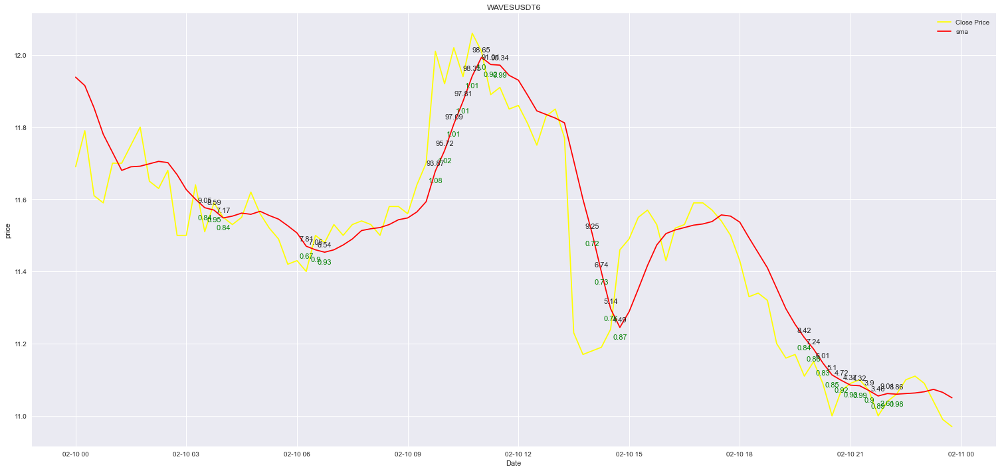

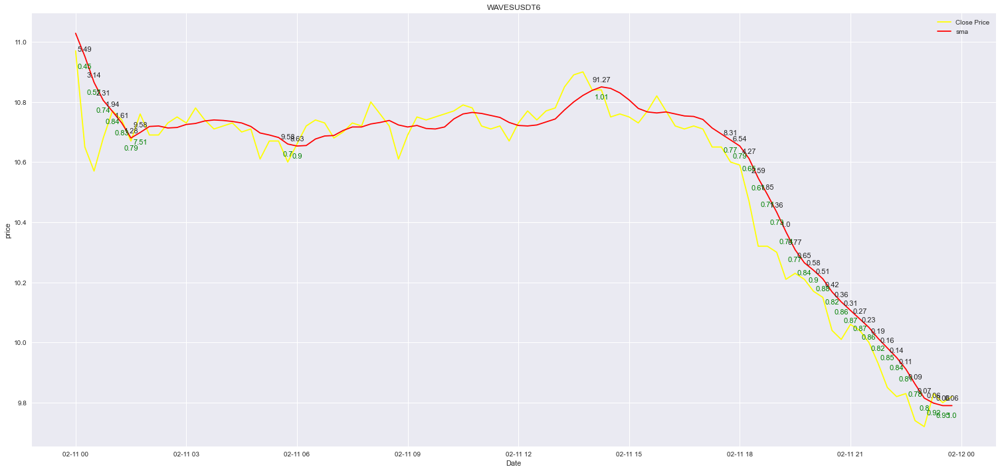

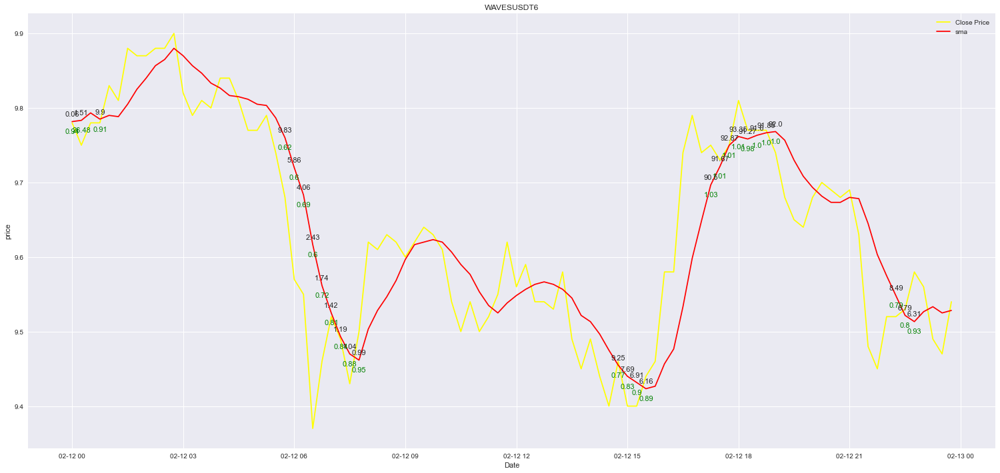

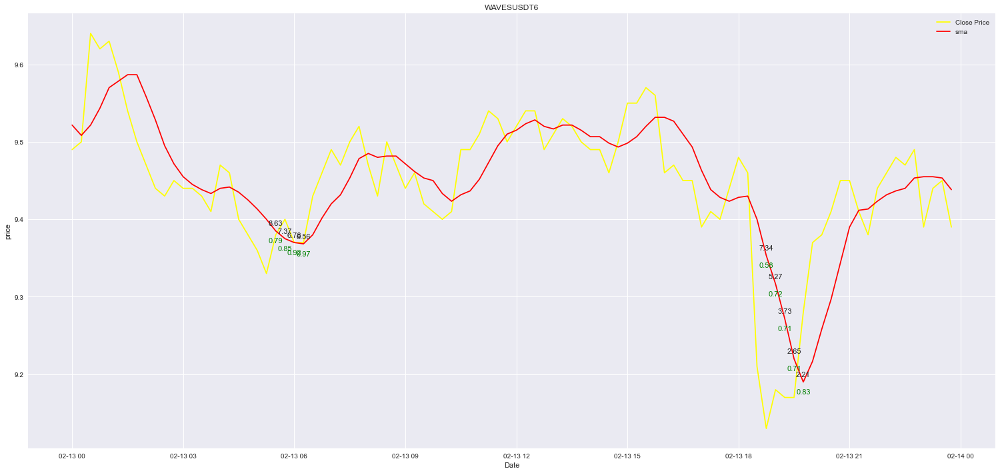

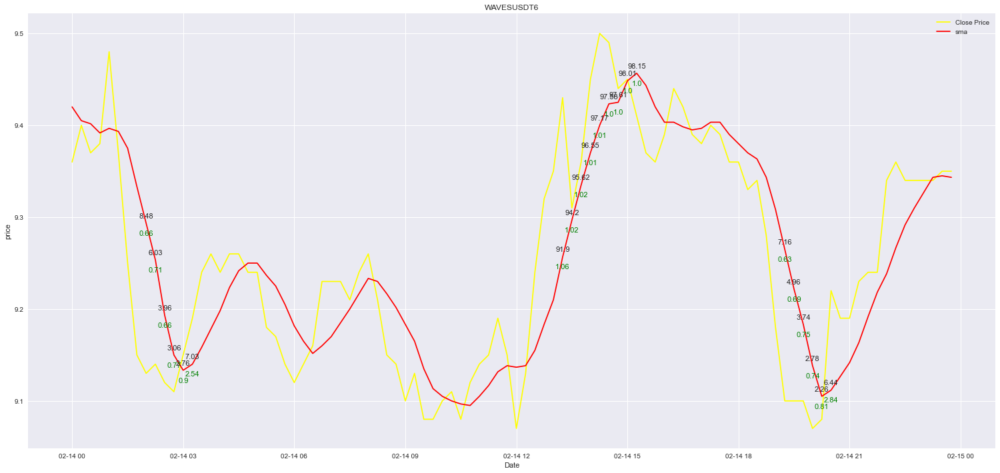

...

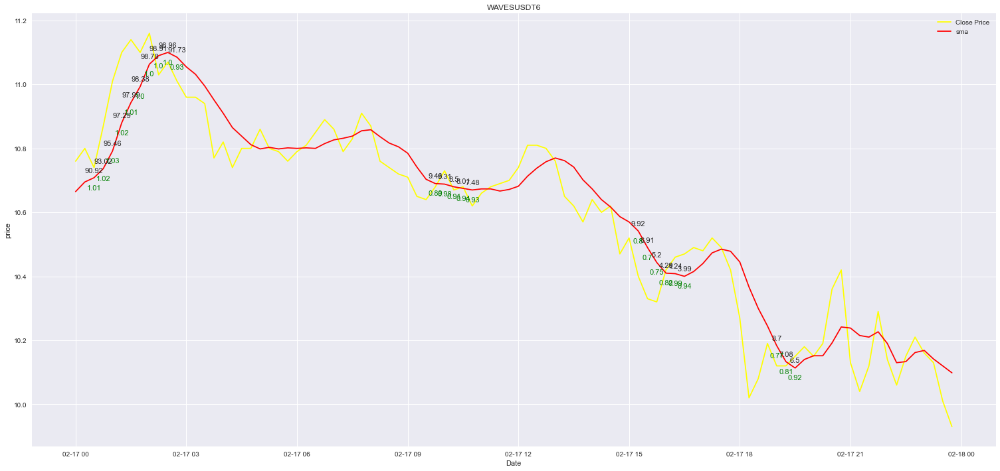

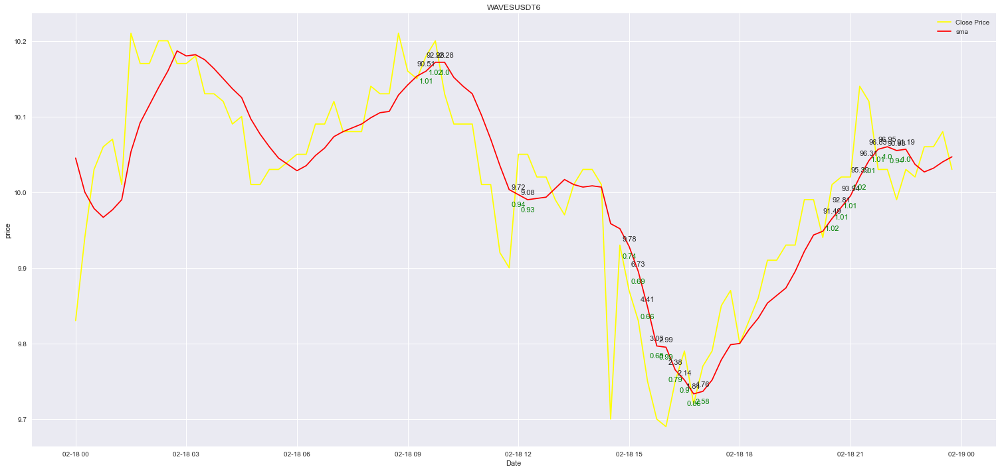

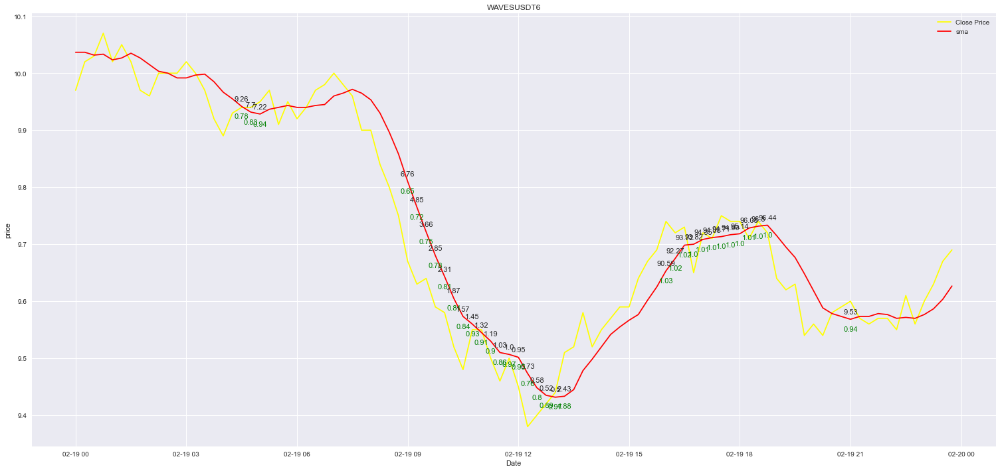

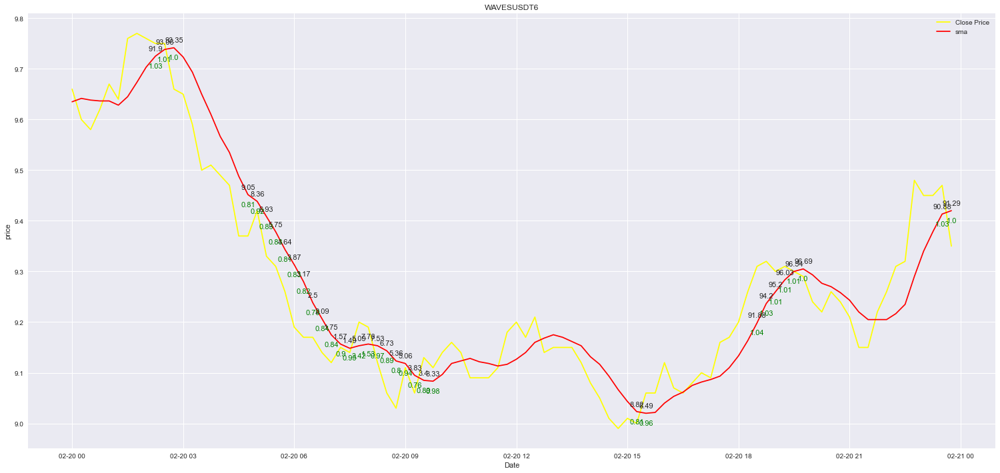

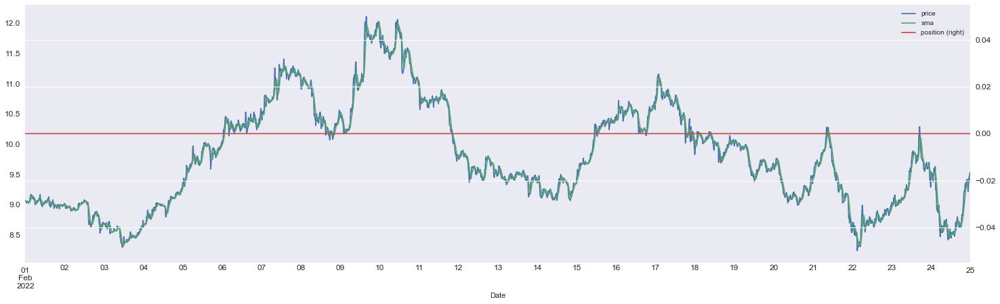

In [29]:
rsi_period = 6
sma_period = 6
current_position=0
lower_threshold = 10; upper_threshold = 90
rsi_limit1 = 1; rsi_limit2  = 1; cutloss_flag=1; cutloss_th=1; increase_flag=0

df = calculate_rsi3(df, rsi_period, sma_period, lower_threshold, upper_threshold, rsi_limit1=rsi_limit1, rsi_limit2=rsi_limit2,
                  cutloss_flag=cutloss_flag, cutloss_th=cutloss_th, increase_flag=increase_flag)
plot_daily_trading(df,from_date,to_date, symbol + str(sma_period), 1)
df.loc[start_time:end_time][["price","sma","position"]].plot(figsize = (25, 7), fontsize = 12, secondary_y = "position",)
df = calculate_performance(df)

## <font color=red>5.2. Increasing trend

(2785, 2)


<AxesSubplot:xlabel='Date', ylabel='price'>

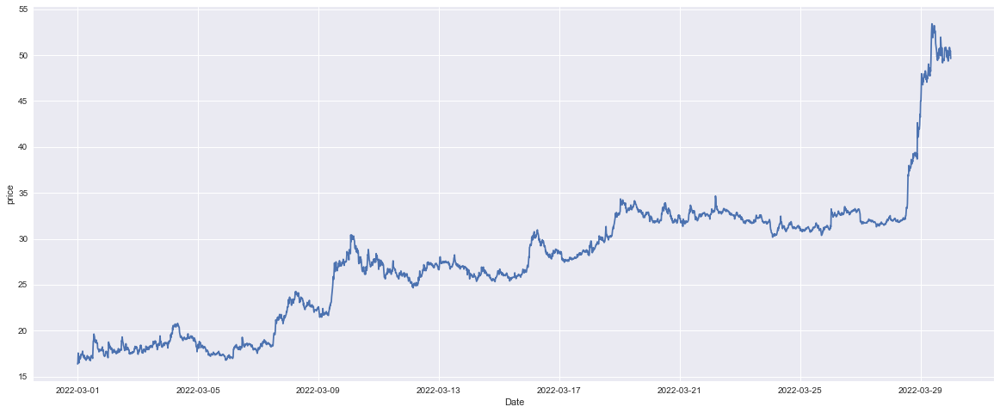

In [30]:
start_time = '2022-03-01'
end_time = '2022-03-30'
current_position=0
lower_threshold = 10; upper_threshold = 90
rsi_limit1 = 1; rsi_limit2  = 1; cutloss_flag=1; cutloss_th=1; increase_flag=1

'''
# this script is for getting data from Binance API
df = get_history(symbol = symbol, interval = "15m", start = str(start_time), end=str(end_time))
#df = get_history(symbol = symbol, interval = "15m", start = str(start_time))
df = df[['Close']]
df.columns = ['price']
df['Date'] = df.index
df.to_csv('increasing_trend.csv', index=False)
'''

df = pd.read_csv('increasing_trend.csv')
df['Date'] = pd.to_datetime(df['Date'])
df.index = df['Date']
print(df.shape)

plt.figure(figsize=(20,8))
sns.lineplot(data=df, x='Date', y='price')

3.0311545510079427 2.2134276361212755 -0.8177269148866673


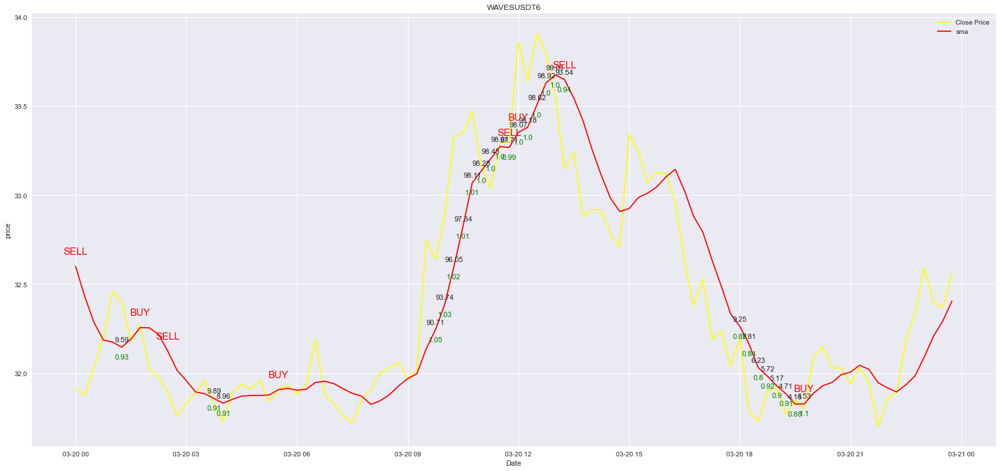

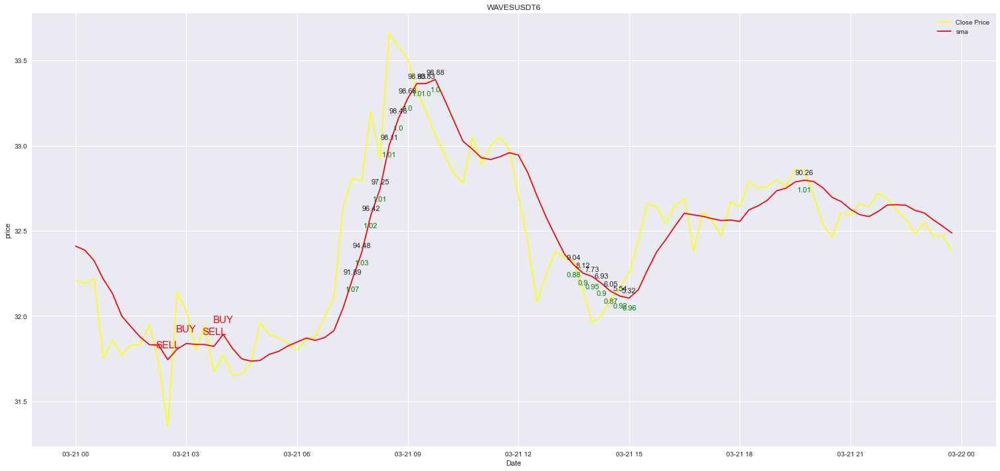

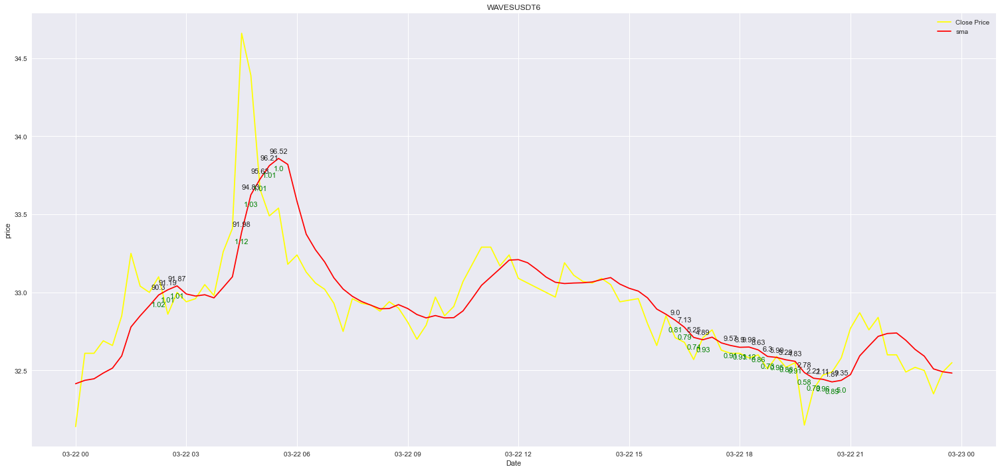

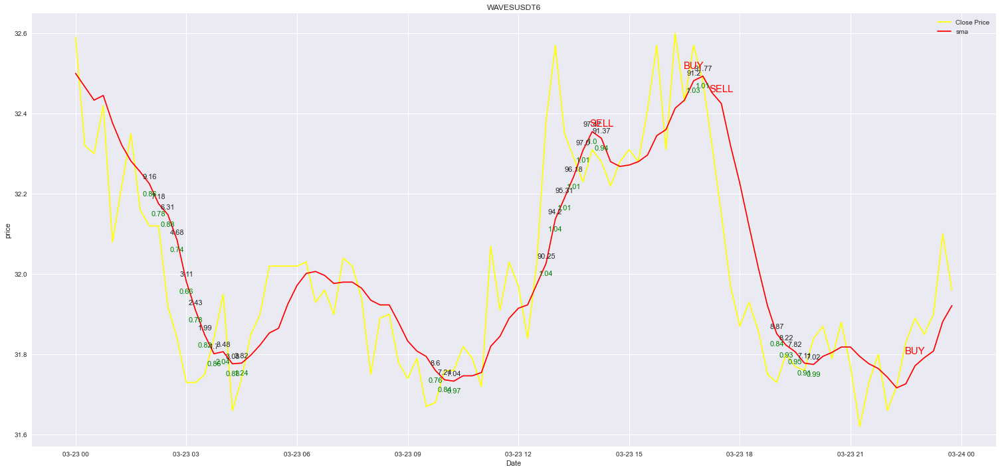

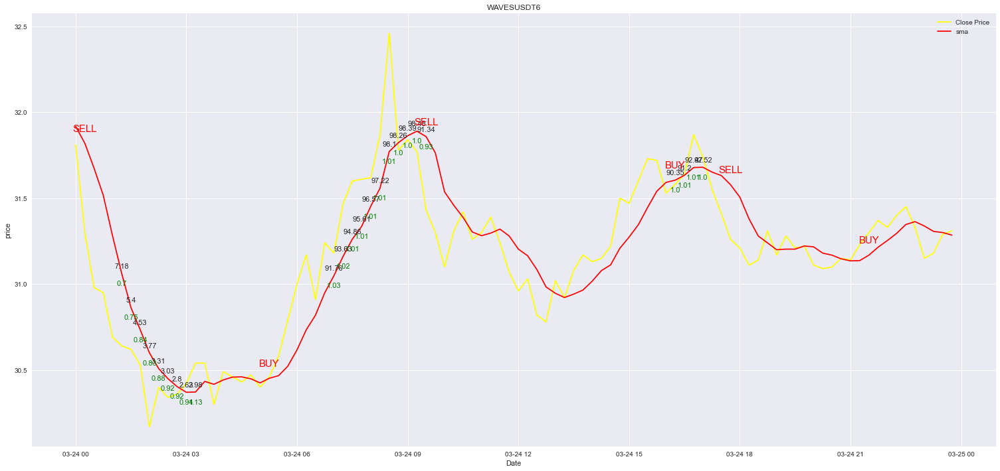

...

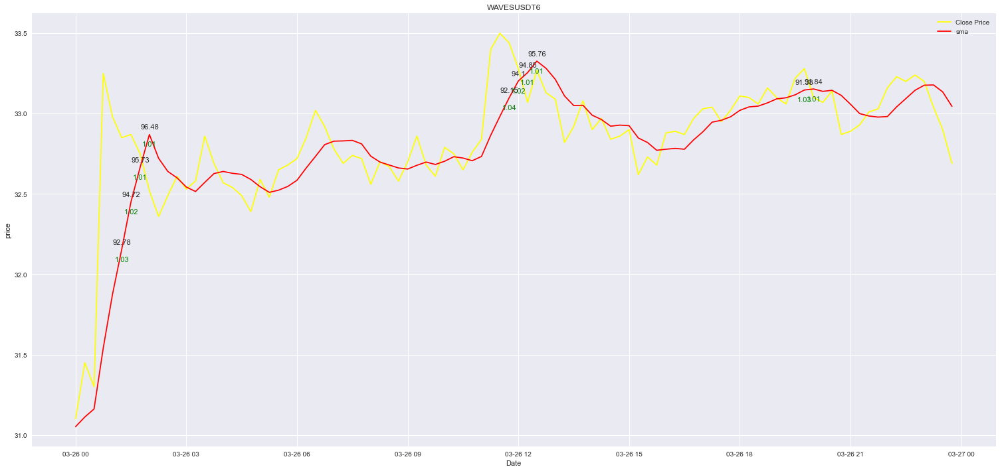

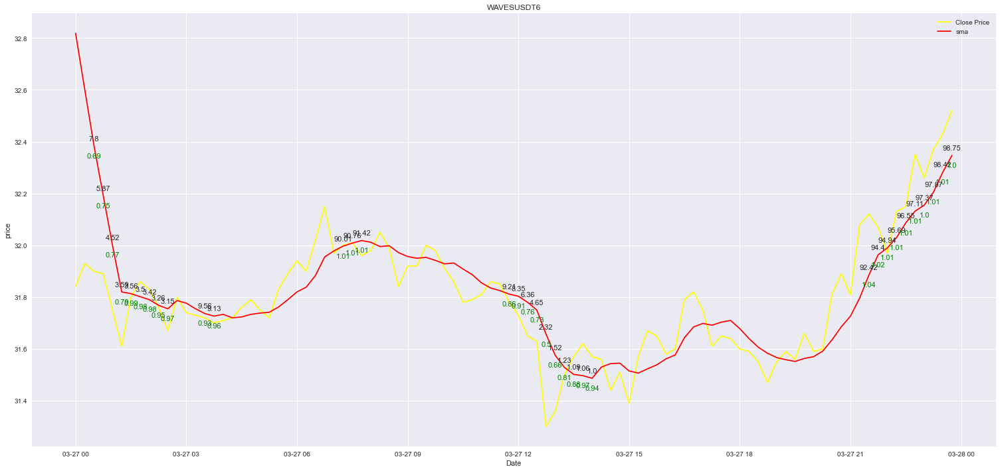

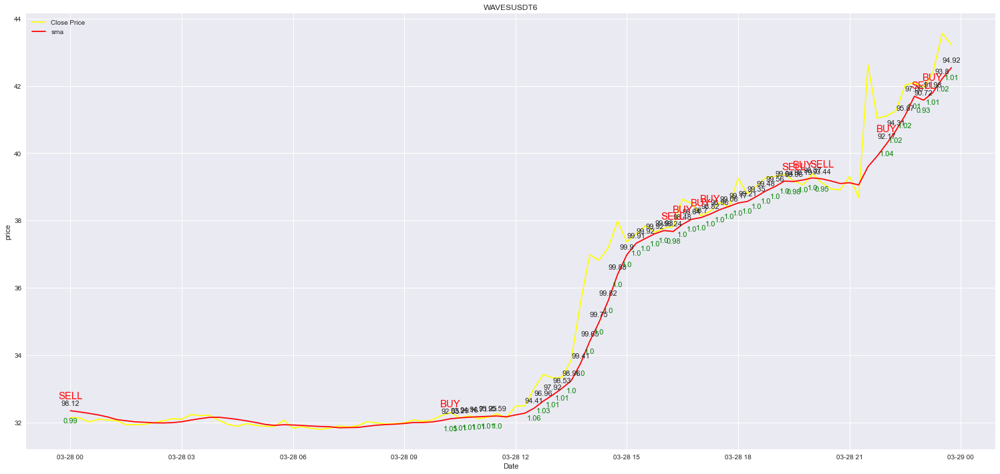

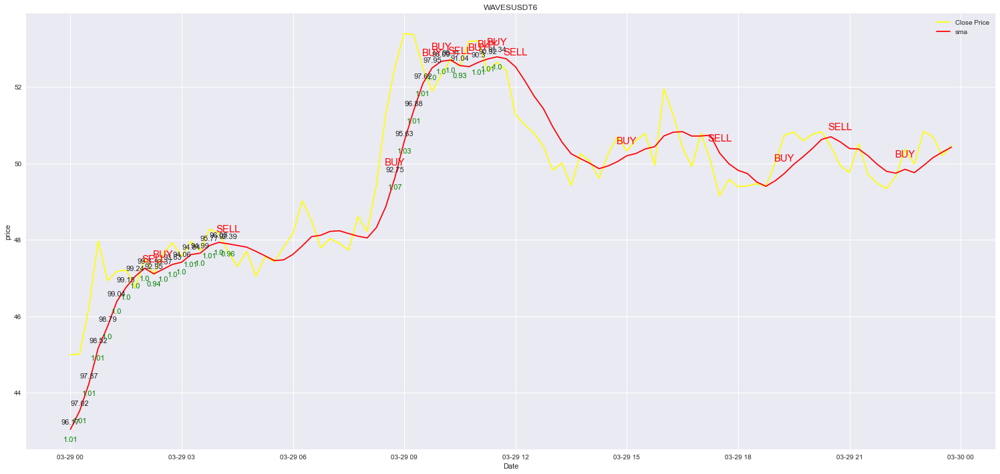

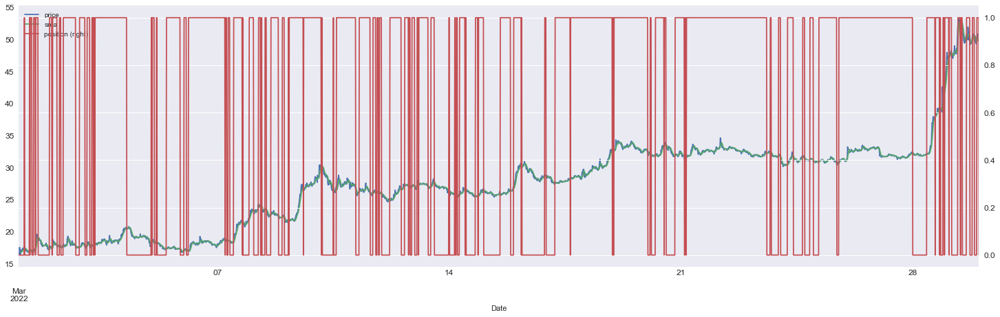

In [31]:
rsi_period = 6
sma_period = 6
from_date = '2022-03-20'
to_date = '2022-03-30'

df = calculate_rsi(df, rsi_period, sma_period, lower_threshold, upper_threshold, rsi_limit1=rsi_limit1, rsi_limit2=rsi_limit2,
                  current_position=current_position, cutloss_flag=cutloss_flag, cutloss_th=cutloss_th, increase_flag=increase_flag)
plot_daily_trading(df,from_date,to_date, symbol + str(sma_period), 1)
df.loc[start_time:end_time][["price","sma","position"]].plot(figsize = (25, 7), fontsize = 12, secondary_y = "position",)
df = calculate_performance(df)

## <font color=red>5.3. Decreasing trend

(1345, 2)


<AxesSubplot:xlabel='Date', ylabel='price'>

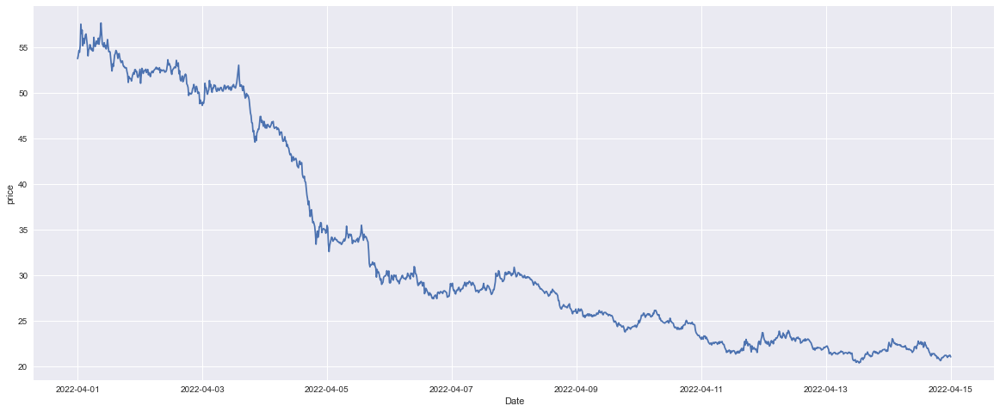

In [32]:
start_time = '2022-04-01'
end_time = '2022-04-15'
current_position=0
lower_threshold = 10; upper_threshold = 90
rsi_limit1 = 1; rsi_limit2  = 1; cutloss_flag=1; cutloss_th=1; increase_flag=1

'''
# this script is for getting data from Binance API
df = get_history(symbol = symbol, interval = "15m", start = str(start_time), end=str(end_time))
df = df[['Close']]
df.columns = ['price']
df['Date'] = df.index
df.to_csv('decreasing_trend.csv', index=False)
'''

df = pd.read_csv('decreasing_trend.csv')
df['Date'] = pd.to_datetime(df['Date'])
df.index = df['Date']
print(df.shape)

plt.figure(figsize=(20,8))
sns.lineplot(data=df, x='Date', y='price')

0.39225902493487264 0.4850575519230061 0.09279852698813346


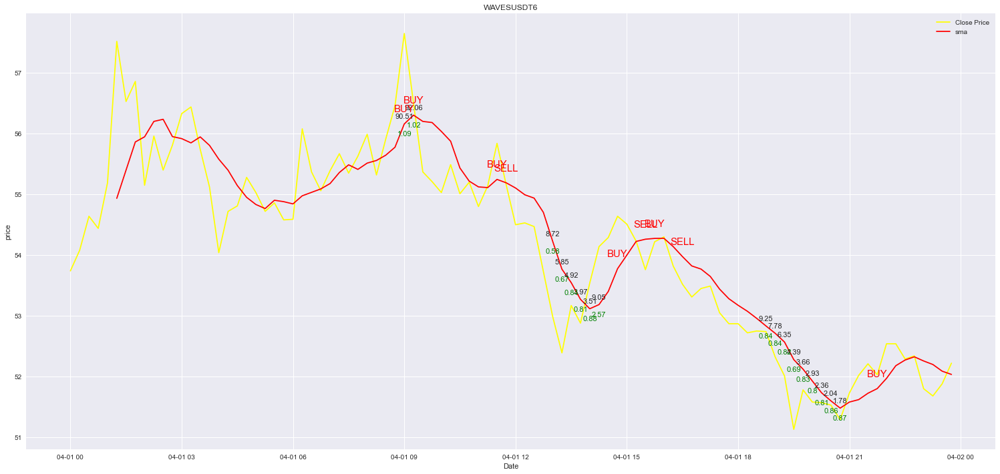

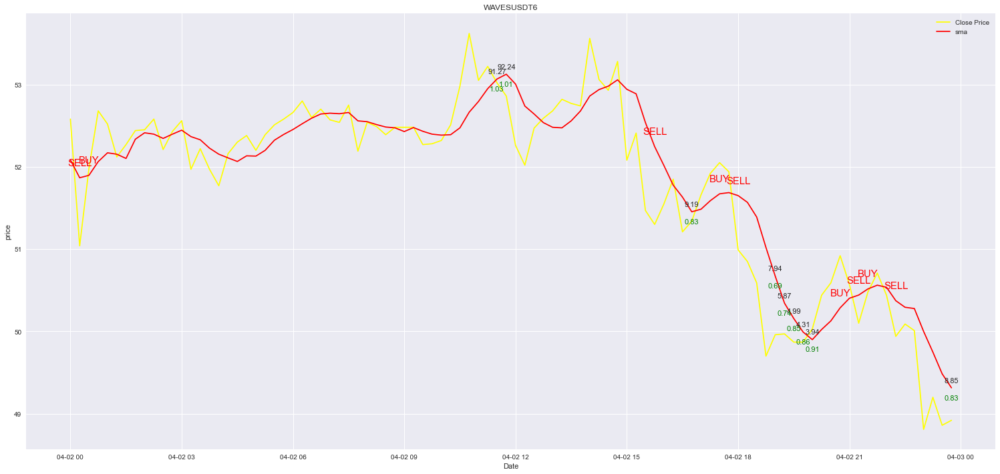

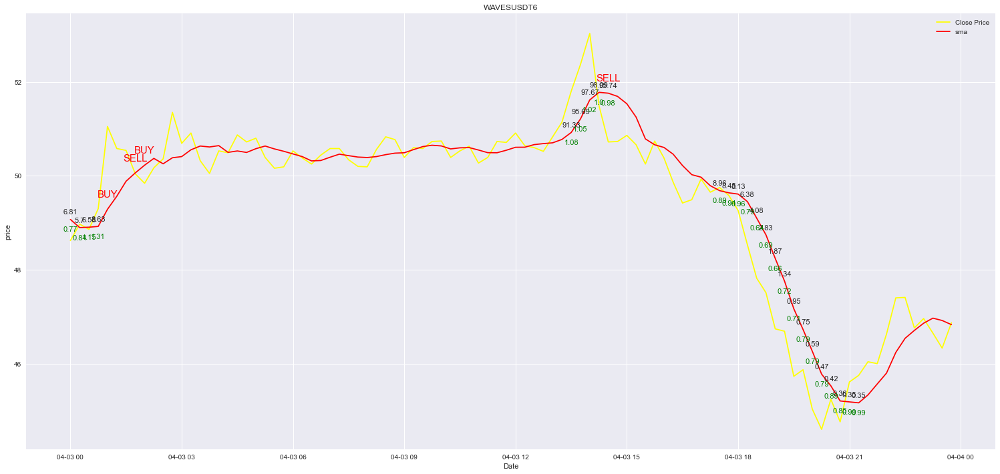

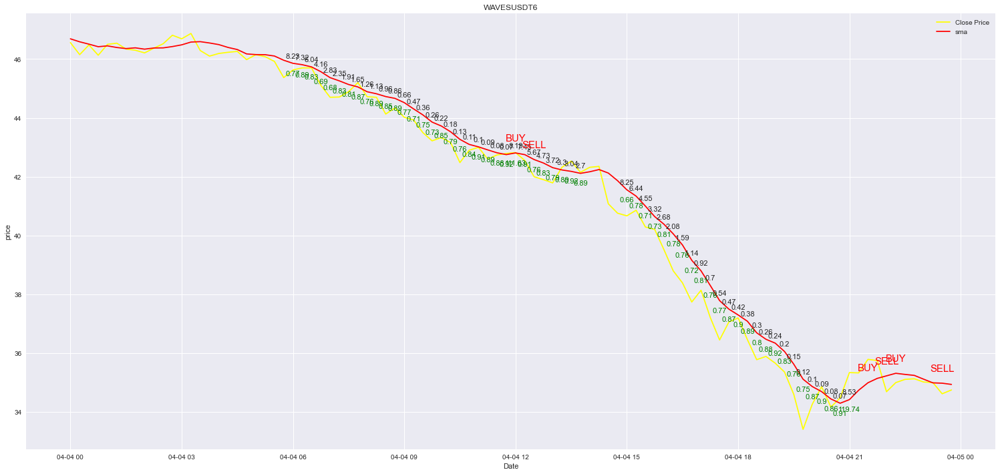

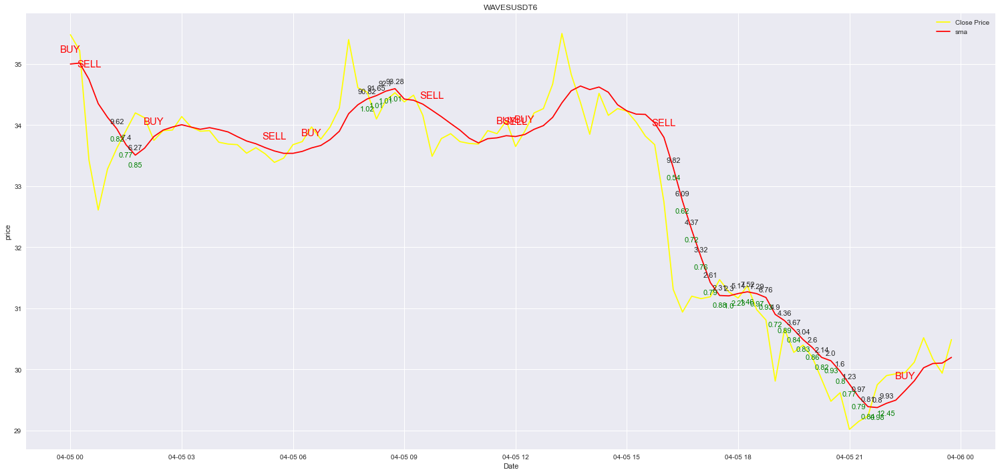

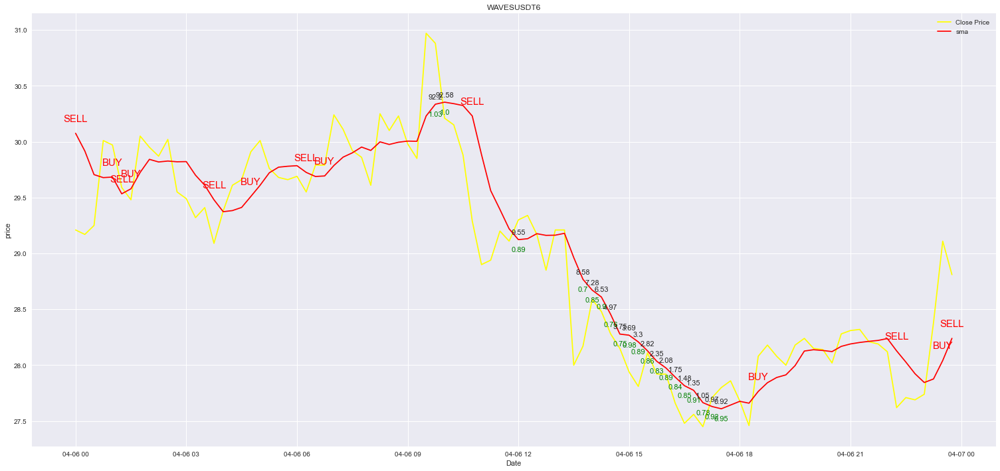

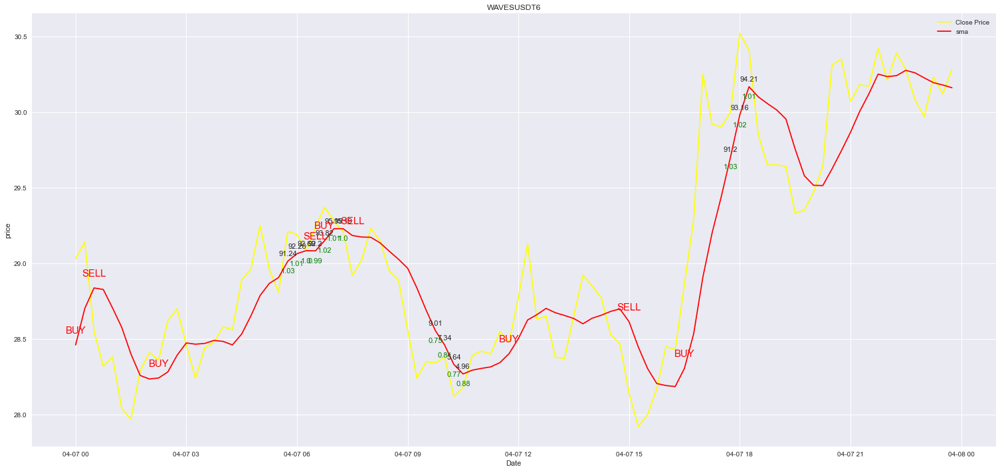

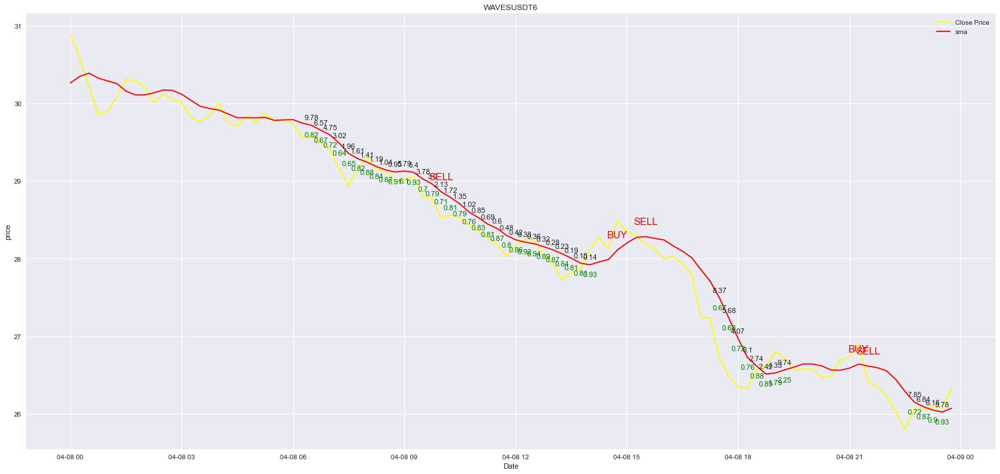

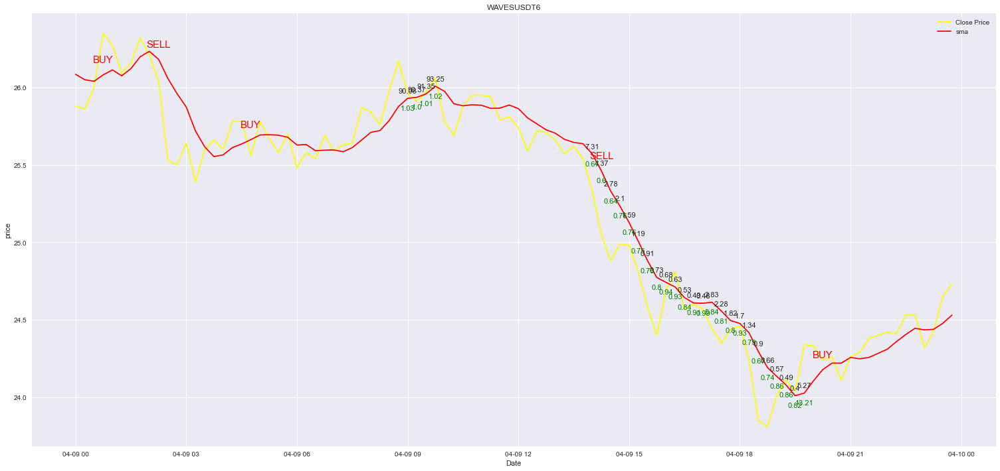

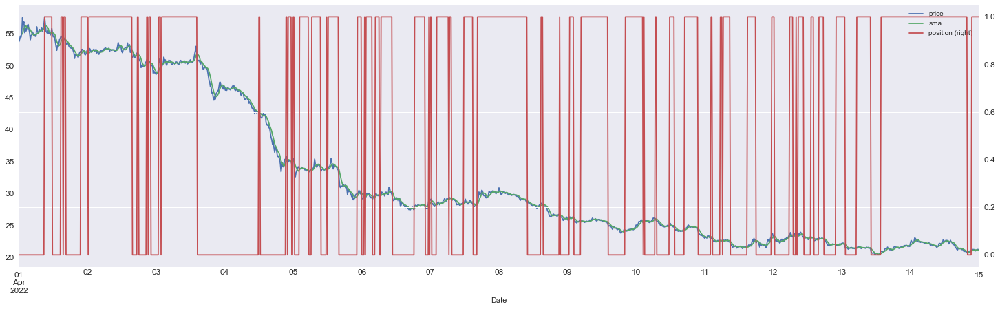

In [34]:
rsi_period = 6
sma_period = 6
from_date = '2022-04-01'
to_date = '2022-04-10'

df = calculate_rsi(df, rsi_period, sma_period, lower_threshold, upper_threshold, rsi_limit1=rsi_limit1, rsi_limit2=rsi_limit2,
                  current_position=current_position, cutloss_flag=cutloss_flag, cutloss_th=cutloss_th, increase_flag=increase_flag)
plot_daily_trading(df,from_date,to_date, symbol + str(sma_period), 1)
df.loc[start_time:end_time][["price","sma","position"]].plot(figsize = (25, 7), fontsize = 12, secondary_y = "position",)
df = calculate_performance(df)

## <font color=red> 5.4. try with different time step

### <font color=blue> 1.  price fluctuating

In [39]:
start_time = '2022-02-01'
end_time = '2022-02-25'
rsi_period = 6
sma_period = 6

current_position=0
lower_threshold = 10; upper_threshold = 90
rsi_limit1 = 1; rsi_limit2  = 1; cutloss_flag=1; cutloss_th=1; increase_flag=1

df1 = pd.read_csv('fluctating_price.csv')
df1['Date'] = df1.index


In [40]:
rsi_creturns_1 = []

for time_step in range(4, 100):
    print(time_step)
    rsi_period = time_step
    sma_period = time_step
    calculate_rsi(df1, rsi_period, sma_period, lower_threshold, upper_threshold, rsi_limit1=rsi_limit1, rsi_limit2=rsi_limit2,
                  cutloss_flag=cutloss_flag, cutloss_th=cutloss_th, increase_flag=increase_flag)    
    calculate_performance(df1)
    rsi_creturns_1.append(df1.iloc[-1].rsi_creturns)

4
1.0518191841234847 0.9301593764734573 -0.12165980765002748
5
1.0518191841234847 1.044404560182398 -0.007414623941086829
6
1.0518191841234847 1.0011778118819643 -0.05064137224152043
7
1.0518191841234847 0.9293411024380595 -0.12247808168542529
8
1.0518191841234847 0.804492640104589 -0.24732654401889576
9
1.0518191841234847 0.7301531911631257 -0.321665992960359
10
1.0518191841234847 1.0314299567716676 -0.02038922735181714
11
1.0518191841234847 0.9185015912448348 -0.13331759287864997
12
1.0518191841234847 1.1035550326317698 0.051735848508285054
13
1.0518191841234847 1.1522045823941727 0.10038539827068793
14
1.0518191841234847 1.231930637928289 0.1801114538048043
15
1.0518191841234847 1.31352611254469 0.26170692842120524
16
1.0518191841234847 1.2999336724460235 0.2481144883225388
17
1.0518191841234847 1.3613397473182258 0.3095205631947411
18
1.0518191841234847 1.2473746216875574 0.19555543756407268
19
1.0518191841234847 1.2719088348036467 0.22008965068016195
20
1.0518191841234847 1.292723

1.7173181228827756 35


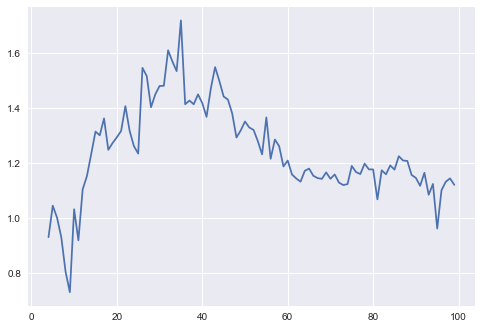

In [42]:
print(np.array(rsi_creturns_1).max(),  np.array(rsi_creturns_1).argmax() + 4)
plt.plot(range(4,100) ,rsi_creturns_1)

### <font color=blue> 2. increasing trend

In [43]:
start_time = '2022-03-01'
end_time = '2022-03-30'
current_position=0
lower_threshold = 10; upper_threshold = 90
rsi_limit1 = 1; rsi_limit2  = 1; cutloss_flag=1; cutloss_th=1; increase_flag=1

df2 = get_history(symbol = symbol, interval = "15m", start = str(start_time), end=str(end_time))
#df = get_history(symbol = symbol, interval = "15m", start = str(start_time))
df2 = df2[['Close']]
df2.columns = ['price']
df2['Date'] = df2.index

In [44]:
rsi_creturns_2 = []

for time_step in range(4, 100):
    print(time_step)
    rsi_period = time_step
    sma_period = time_step
    df2 = calculate_rsi(df2, rsi_period, sma_period, lower_threshold, upper_threshold, rsi_limit1=rsi_limit1, rsi_limit2=rsi_limit2,
                  cutloss_flag=cutloss_flag, cutloss_th=cutloss_th, increase_flag=increase_flag)    
    calculate_performance(df2)
    rsi_creturns_2.append(df2.iloc[-1].rsi_creturns)

4
3.0311545510079427 2.189709735341956 -0.8414448156659868
5
3.0311545510079427 2.6761864669702042 -0.3549680840377385
6
3.0311545510079427 2.2134276361212755 -0.8177269148866673
7
3.0311545510079427 2.0170609767911087 -1.014093574216834
8
3.0311545510079427 1.4689206060365905 -1.5622339449713523
9
3.0311545510079427 1.9330923890883145 -1.0980621619196282
10
3.0311545510079427 1.9776735124891254 -1.0534810385188174
11
3.0311545510079427 1.530162396059444 -1.5009921549484988
12
3.0311545510079427 1.3323743832414523 -1.6987801677664904
13
3.0311545510079427 1.9284120669848426 -1.1027424840231002
14
3.0311545510079427 2.0916365529480205 -0.9395179980599222
15
3.0311545510079427 2.30433279911056 -0.7268217518973827
16
3.0311545510079427 2.943837014262062 -0.08731753674588072
17
3.0311545510079427 2.3259240269487758 -0.705230524059167
18
3.0311545510079427 2.483706315007267 -0.5474482360006756
19
3.0311545510079427 2.1920091841514866 -0.8391453668564561
20
3.0311545510079427 1.7426640082221

2.943837014262062 16


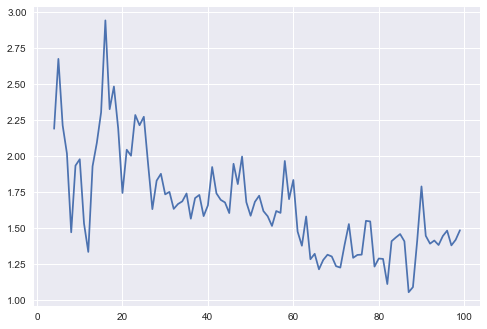

In [45]:
print(np.array(rsi_creturns_2).max(),  np.array(rsi_creturns_2).argmax() + 4)
plt.plot(range(4,100) ,rsi_creturns_2)

### <font color=blue> 3. decreasing trend

In [46]:
start_time = '2022-04-01'
end_time = '2022-04-15'
current_position=0
lower_threshold = 10; upper_threshold = 90
rsi_limit1 = 1; rsi_limit2  = 1; cutloss_flag=1; cutloss_th=1; increase_flag=1

df3 = get_history(symbol = symbol, interval = "15m", start = str(start_time), end=str(end_time))
df3 = df3[['Close']]
df3.columns = ['price']
df3['Date'] = df3.index


In [47]:
rsi_creturns_3 = []

for time_step in range(4, 100):
    print(time_step)
    rsi_period = time_step
    sma_period = time_step
    df3 = calculate_rsi(df3, rsi_period, sma_period, lower_threshold, upper_threshold, rsi_limit1=rsi_limit1, rsi_limit2=rsi_limit2,
                  cutloss_flag=cutloss_flag, cutloss_th=cutloss_th, increase_flag=increase_flag)    
    calculate_performance(df3)
    rsi_creturns_3.append(df3.iloc[-1].rsi_creturns)

4
0.39225902493487264 0.5430005116547272 0.15074148671985454
5
0.39225902493487264 0.6233016472530813 0.2310426223182087
6
0.39225902493487264 0.4850575519230061 0.09279852698813346
7
0.39225902493487264 0.48081393580822757 0.08855491087335493
8
0.39225902493487264 0.6085028443220197 0.2162438193871471
9
0.39225902493487264 0.6077449964179628 0.21548597148309012
10
0.39225902493487264 0.6849526746996089 0.2926936497647362
11
0.39225902493487264 0.6545520184213253 0.26229299348645263
12
0.39225902493487264 0.7109497702429228 0.3186907453080502
13
0.39225902493487264 0.6946570173270078 0.30239799239213516
14
0.39225902493487264 0.737076221454043 0.3448171965191703
15
0.39225902493487264 0.6978365816430723 0.30557755670819964
16
0.39225902493487264 0.6745681039810134 0.2823090790461408
17
0.39225902493487264 0.6894313498027823 0.2971723248679097
18
0.39225902493487264 0.8543660167365765 0.4621069918017039
19
0.39225902493487264 0.764560038512153 0.3723010135772804
20
0.39225902493487264 0

0.9073680126607683 23


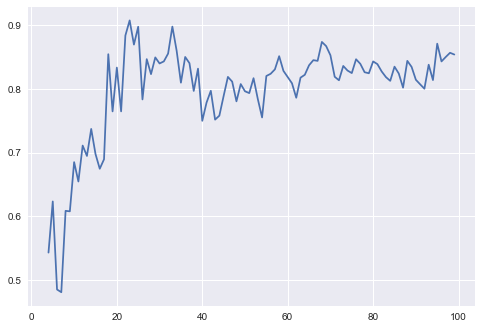

In [48]:
print(np.array(rsi_creturns_3).max(),  np.array(rsi_creturns_3).argmax() + 4)
plt.plot(range(4,100) ,rsi_creturns_3)

### <font color=blue> 4. overall: combine all type of trends

1.639446263563033 16


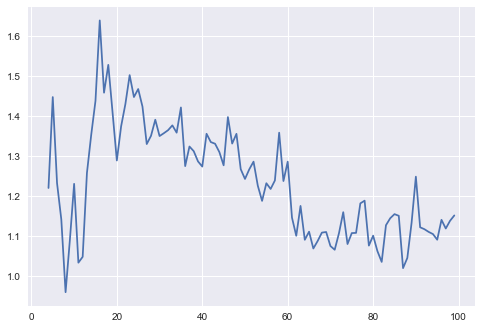

In [49]:
rsi_creturns = []

for i in range(0,len(rsi_creturns_1)):
    rsi_creturns.append((rsi_creturns_1[i] + rsi_creturns_2[i] + rsi_creturns_3[i])/3.)

print(np.array(rsi_creturns).max(),  np.array(rsi_creturns).argmax() + 4)
plt.plot(range(4,100) ,rsi_creturns)

In [50]:
(df1.iloc[-1].creturns + df2.iloc[-1].creturns + df3.iloc[-1].creturns)/3.

1.4917442533554335

In [199]:
start_time = '2022-01-01'
end_time = '2022-06-30'
current_position=0
lower_threshold = 10; upper_threshold = 90
rsi_limit1 = 1; rsi_limit2  = 1; cutloss_flag=1; cutloss_th=2; increase_flag=1

df = get_history(symbol = symbol, interval = "15m", start = str(start_time), end=str(end_time))
df = df[['Close']]
df.columns = ['price']
df['Date'] = df.index


In [200]:
rsi_creturns = []

for time_step in range(4, 100):
    print(time_step)
    rsi_period = time_step
    sma_period = time_step
    calculate_rsi(df, rsi_period, sma_period, lower_threshold, upper_threshold, rsi_limit1=rsi_limit1, rsi_limit2=rsi_limit2,
                  cutloss_flag=cutloss_flag, cutloss_th=cutloss_th, increase_flag=increase_flag)    
    calculate_performance(df)
    rsi_creturns.append(df.iloc[-1].rsi_creturns)

4
0.363885088919293 0.5737749496883112 0.20988986076901822
5
0.363885088919293 1.1226963866409312 0.7588112977216381
6
0.363885088919293 0.6784041825495506 0.3145190936302576
7
0.363885088919293 0.49630100445921393 0.13241591553992094
8
0.363885088919293 0.36139991599961324 -0.0024851729196797567
9
0.363885088919293 0.3426571464295516 -0.021227942489741414
10
0.363885088919293 0.5778442097090285 0.2139591207897355
11
0.363885088919293 0.7979788701270448 0.4340937812077518
12
0.363885088919293 1.4109952235559406 1.0471101346366476
13
0.363885088919293 1.6293306517374961 1.265445562818203
14
0.363885088919293 3.3043261333733276 2.9404410444540345
15
0.363885088919293 3.53385129032305 3.169966201403757
16
0.363885088919293 2.4384767026012084 2.0745916136819154
17
0.363885088919293 2.5865380063284014 2.2226529174091083
18
0.363885088919293 2.5059147277365192 2.142029638817226
19
0.363885088919293 2.6790885813547622 2.315203492435469
20
0.363885088919293 1.7916030888132937 1.427717999894000

4.330337352524253 29


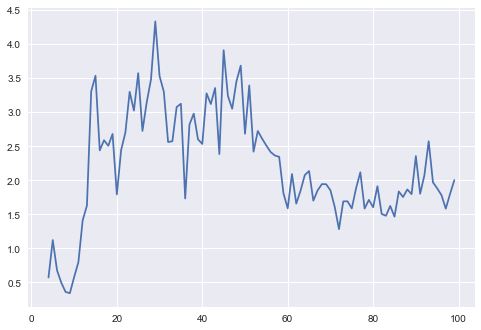

In [201]:
print(np.array(rsi_creturns).max(),  np.array(rsi_creturns).argmax() + 4)
plt.plot(range(4,100) ,rsi_creturns)

In [198]:
len(rsi_creturns)

96

---
---
# <div class="alert alert-info"> 6. Define Class<div>


## <font color=red> 6.1. Define class

In [51]:
import time


class Coin_Trading:
    """
    This class enables data loading, plotting and statistical analysis of a given stock,
     upon initialization load a sample of data to check if stock exists. 
        
    """
    def __init__(self, symbol, current_position=0):
       
        self.symbol = symbol
        self.current_position = current_position


    def get_earliest_valid_timestamp(self, interval):
        timestamp = client._get_earliest_valid_timestamp(symbol = self.symbol, interval = interval)
        start_time = pd.to_datetime(timestamp, unit = "ms")
        return start_time


    def get_historical_bitcoin_data(self, interval, start, end=None, most_recent_obs=0):

        start = str(start)
        end = str(end)

        bars = client.get_historical_klines(symbol = self.symbol, interval = interval,
                                            start_str = start, end_str = end, limit = 1000)
        data = pd.DataFrame(bars)
        data["Date"] = pd.to_datetime(data.iloc[:,0], unit = "ms")
        data.columns = ["Open Time", "Open", "High", "Low", "Close", "Volume",
                      "Clos Time", "Quote Asset Volume", "Number of Trades",
                      "Taker Buy Base Asset Volume", "Taker Buy Quote Asset Volume", "Ignore", "Date"]
        data = data[["Date", "Open", "High", "Low", "Close", "Volume"]].copy()
        try:
            assert len(data) > 0
        except AssertionError:
            print("Cannot fetch data, check spelling or time window")
        for column in ["Open", "High", "Low", "Close", "Volume"]:
            data[column] = pd.to_numeric(data[column], errors = "coerce")
        data.set_index("Date", drop = True)
        data = data.rename(columns = {'Close': 'price'})
        self.data = data
        self.start = start
        self.end = end

    def rsi_back_testing(self, rsi_period, sma_period, lower_th, upper_th, rsi_limit1=None,rsi_limit2=None,
                         current_position=0, cutloss_flag=0, cutloss_th=0.3, increase_flag=0,units=1):
        data = self.data.copy()
        
        data['sma'] = data['price'].rolling(sma_period).mean()
        data['rsi'] = pta.rsi(data['sma'], rsi_period)
        data['rsi_indicator'] = np.nan
        data['rsi_signal'] = np.nan
        data['position'] = current_position
        data['strategy'] = np.nan
        cut_loss = 0

        data['rsi_1'] = data['rsi'].shift(1)
        data['rsi_ratio'] = data['rsi']/data['rsi_1']

        data.loc[(data['rsi'] > upper_th), 'rsi_indicator'] = 0
        data.loc[data['rsi'] < lower_th, 'rsi_indicator'] = 1

        if(rsi_limit2 == None):
            data.loc[(data['rsi'] > upper_th) , 'rsi_signal'] = 'SELL'
        else:
            data.loc[(data['rsi'] > upper_th) & (data['rsi_ratio'] < rsi_limit2), 'rsi_signal'] = 'SELL'

        if(rsi_limit1 == None):
            data.loc[(data['rsi'] < lower_th) , 'rsi_signal'] = 'BUY'
        else:
            data.loc[(data['rsi'] < lower_th) & (data['rsi_ratio'] > rsi_limit1), 'rsi_signal'] = 'BUY'
            
        if((cutloss_flag == 1) & (increase_flag == 1)):        
            for index, row in data.iterrows():
                if(cut_loss == 0):
                    current_price = data.loc[index, 'price']
                    if(data.loc[index,'rsi_signal'] == "BUY"):
                        if(current_position == 0):
                            current_position = 1
                            data.loc[index, 'strategy'] = 'BUY'
                            buy_price = data.loc[index, 'price']
                    elif(data.loc[index,'rsi_signal'] == 'SELL'):
                        if(current_position == 1):
                            current_position = 0
                            data.loc[index, 'strategy'] = 'SELL'
                    # cut loss
                    if(current_position == 1):
                        #if(current_price < buy_price - cutloss_th):
                        difference = current_price - buy_price
                        if( difference <= - ((cutloss_th * buy_price) /100)):
                            current_position = 0
                            data.loc[index, 'strategy'] = 'SELL'   
                            cut_loss = 1
                    # increase trend => buy again (dont wait until price goes down)
                    if(current_position == 0):
                        if((data.loc[index,'rsi'] > upper_th) & ((data.loc[index,'rsi_ratio'] > rsi_limit1))):
                            current_position = 1
                            data.loc[index, 'strategy'] = 'BUY'
                            buy_price = data.loc[index, 'price']                        
                elif(cut_loss == 1):
                    if(data.loc[index,'rsi'] > 30):
                        current_position = 1
                        data.loc[index, 'strategy'] = 'BUY'
                        buy_price = data.loc[index, 'price']    
                        cut_loss = 0
                
                data.loc[index,'position'] = current_position

        self.trading_data = data


    def calculate_performance(self):
        self.trading_data["returns"] = np.log(self.trading_data.price.div(self.trading_data.price.shift(1)))
        self.trading_data["creturns"] = self.trading_data["returns"].cumsum().apply(np.exp)
        
        self.trading_data["strategy_returns"] =np.log(self.trading_data.price.div(self.trading_data.price.shift(1)))
        # case 1: udpate rsi returns on records not holding asset
        self.trading_data.loc[(self.trading_data['position'] == 0) & (~self.trading_dat['strategy'].isin(['BUY','SELL'])), 'strategy_returns'] = 0
        # case 2: update rsi returns on records not buying to 0
        self.trading_dat.loc[(self.trading_dat['position'] == 1) & (self.trading_dat['strategy']=='BUY'), 'strategy_returns'] = 0           
        self.trading_data["strategy_creturns"] = self.trading_data["strategy_returns"].cumsum().apply(np.exp)  
              

    def rsi_strategy(self, rsi_period, sma_period, lower_th, upper_th, rsi_limit1=None,rsi_limit2=None,
                     current_position=0, cutloss_flag=1, cutloss_th=1, increase_flag=1,units=1):
           
        data = self.data.copy()
        
        data['sma'] = data['price'].rolling(sma_period).mean()
        data['rsi'] = pta.rsi(data['sma'], rsi_period)
        data['rsi_indicator'] = np.nan
        data['rsi_signal'] = np.nan
        data['position'] = current_position
        data['strategy'] = np.nan
        cut_loss = 0

        data['rsi_1'] = data['rsi'].shift(1)
        data['rsi_ratio'] = data['rsi']/data['rsi_1']
        data.loc[(data['rsi'] > upper_th), 'rsi_indicator'] = 0
        data.loc[data['rsi'] < lower_th, 'rsi_indicator'] = 1

        if(rsi_limit2 == None):
            data.loc[(data['rsi'] > upper_th) , 'rsi_signal'] = 'SELL'
        else:
            data.loc[(data['rsi'] > upper_th) & (data['rsi_ratio'] < rsi_limit2), 'rsi_signal'] = 'SELL'

        if(rsi_limit1 == None):
            data.loc[(data['rsi'] < lower_th) , 'rsi_signal'] = 'BUY'
        else:
            data.loc[(data['rsi'] < lower_th) & (data['rsi_ratio'] > rsi_limit1), 'rsi_signal'] = 'BUY'

        print('test this case', cutloss_flag, increase_flag)

        index = data.index[-1]
            
        if((cutloss_flag == 1) & (increase_flag == 1)):        
            if(cut_loss == 0):
                current_price = data.loc[index, 'price']
                if(data.loc[index,'rsi_signal'] == "BUY"):
                    if(current_position == 0):
                        current_position = 1
                        data.loc[index, 'strategy'] = 'BUY'
                        buy_price = data.loc[index, 'price']
                elif(data.loc[index,'rsi_signal'] == 'SELL'):
                    if(current_position == 1):
                        current_position = 0
                        data.loc[index, 'strategy'] = 'SELL'
                # cut loss
                if(current_position == 1):
                    #if(current_price < buy_price - cutloss_th):
                    difference = current_price - buy_price
                    if( difference <= - ((cutloss_th * buy_price) /100)):
                        current_position = 0
                        data.loc[index, 'strategy'] = 'SELL'   
                        cut_loss = 1
                # increase trend
                if(current_position == 0):
                    if((data.loc[index,'rsi'] > upper_th) & ((data.loc[index,'rsi_ratio'] > 1.05))):
                        current_position = 1
                        data.loc[index, 'strategy'] = 'BUY'
                        buy_price = data.loc[index, 'price']                        
            elif(cut_loss == 1):
                if(data.loc[index,'rsi'] > 30):
                    current_position = 1
                    data.loc[index, 'strategy'] = 'BUY'
                    buy_price = data.loc[index, 'price']    
                    cut_loss = 0
            data.loc[index,'position'] = current_position
            self.current_position = current_position

        return data.tail(1)  


    def rsi_trading(self, start_time, bar_length, rsi_period, sma_period, lower_th, upper_th, rsi_limit1,rsi_limit2,
                    position=0, cutloss_flag=1, cutloss_th=0.3, increase_flag=1,units=1):      
        result_df = pd.DataFrame()
        current_time = datetime.utcnow().strftime('%Y-%m-%d %H:%M:%S')
        current_time = pd.to_datetime(current_time)
        print('Current time: ', current_time)

        self.get_historical_bitcoin_data(interval = bar_length, start = str(start_time), end = str(current_time), most_recent_obs=0)
        index = self.data.index[-1] 
        latest_time = pd.to_datetime(self.data.loc[index, 'Date'])
        print('Latest time of 15mins interval: ', latest_time)  

        next_time = latest_time + timedelta(hours = 0.25)
        print('Waiting until ', pd.to_datetime(next_time))
        print('Start counting...')

        while True:                  
            if (current_time >= next_time):
                time.sleep(20)
                self.get_historical_bitcoin_data(interval = bar_length, start = str(start_time), end = str(current_time), most_recent_obs=0)
                index = self.data.index[-1]
                result = self.rsi_strategy(rsi_period, sma_period, lower_th, upper_th, rsi_limit1=rsi_limit1,rsi_limit2=rsi_limit2,
                                           current_position=self.current_position, cutloss_flag=cutloss_flag, cutloss_th=cutloss_th, increase_flag=increase_flag,units=units)
                result_df = result_df.append(result)
                print(result[['Date','price','rsi','rsi_1','rsi_ratio','rsi_signal','position','strategy']],'\n')
                
                if( result.strategy.values[0] != 'N/A'):
                    if result.strategy.values[0] == 'BUY': # signal to go long
                        order = client.create_order(symbol = self.symbol, side = "BUY", type = "MARKET", quantity = units)
                        st.write('buying done')
                    elif result.strategy.values[0] == 'SELL': # signal to go short
                        order = client.create_order(symbol = self.symbol, side = "SELL", type = "MARKET", quantity = units)
                        st.write('selling done')
                current_time = pd.to_datetime(datetime.utcnow().strftime('%Y-%m-%d %H:%M:%S'))
                next_time = pd.to_datetime(self.data.loc[index, 'Date']) + timedelta(hours = 0.25)
                print('waiting until ', next_time)
                print('start counting ...')
                result_df.to_csv(symbol + '_trading.csv', index=False)
                
            print('\n', str(current_time), end=" ", flush=True)
            time.sleep(60)
            current_time = pd.to_datetime(datetime.utcnow().strftime('%Y-%m-%d %H:%M:%S'))

## <font color=red> 6.2. Trading

In [ ]:
symbol = 'WAVESUSDT'
start_time = '2022-08-15'
bar_length = "15m"
units = 2
position = 0
rsi_period = 6; sma_period = 6
lower_threshold = 10; upper_threshold = 90
rsi_limit1 = 1; rsi_limit2  = 1
cutloss_flag = 1; increase_flag = 1

ct = Coin_Trading(symbol=symbol)
ct.rsi_trading(start_time, bar_length, rsi_period, sma_period, lower_threshold, upper_threshold, rsi_limit1=rsi_limit1,rsi_limit2=rsi_limit2,position = position, cutloss_flag=cutloss_flag, increase_flag=increase_flag)